# Importing Library

In [ ]:
import pandas as pd
import numpy as np
import yfinance as yf
from datetime import datetime
import matplotlib.pyplot as plt
from tqdm import tqdm
from sklearn.preprocessing import MinMaxScaler

import tensorflow as tf
from keras.models import Model
from keras.layers import Input, LSTM, Dense, Reshape, Dropout, GRU, Conv2D, Conv1D, TimeDistributed
from tensorflow.keras.layers import BatchNormalization
from tqdm import tqdm
from tensorflow.keras.layers import Input, Dense, Concatenate, Reshape, LSTM, MultiHeadAttention
from tensorflow.keras.layers import Input, Dense, Concatenate, Reshape, LSTM, MultiHeadAttention, Attention, AdditiveAttention
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import Callback


In [ ]:
scaler = MinMaxScaler()


def dataset_gen(data_full_df):

    columns_to_normalize = ['Open','High', 'Low', 'Close', 'Volume']
    data_full_df[columns_to_normalize] = scaler.fit_transform(data_full_df[columns_to_normalize])
    data_full_df = data_full_df.drop(columns=['Adj Close'], axis=1)
    print(data_full_df.head(5))
    data_full_np = data_full_df.values

    x_train = []
    y_train = []
    x_test = []
    y_test = []

    last_index = 0
    for i in tqdm(range(0, data_full_np.shape[0] - 300)):
        x_train.append(data_full_np[i:i + 200])
        y_train.append(data_full_np[i + 200:i + 220])
        last_index= i
    x_train = np.array(x_train)
    y_train = np.array(y_train)

    x_test.append( data_full_np[last_index+10: last_index+210])
    y_test.append(data_full_np[last_index+210: last_index+230])
    x_test.append(data_full_np[last_index+40: last_index+240])
    y_test.append(data_full_np[last_index+240: last_index+260])
    x_test.append(data_full_np[last_index+60: last_index+260])
    y_test.append(data_full_np[last_index+260: last_index+280])

    x_test = np.array(x_test)
    y_test = np.array(y_test)

    print(x_train.shape, y_train.shape, x_test.shape, y_test.shape)
    return x_train, y_train, x_test, y_test

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Importing datset and prepocessing

## Amazon dataset

In [ ]:
AMZN_df = pd.read_csv('/content/drive/MyDrive/DLS_final_pro/new/AMZN.csv')

print(AMZN_df.info())
print(AMZN_df.describe())

AMZN_x_train, AMZN_y_train, AMZN_x_test, AMZN_y_test = dataset_gen(AMZN_df)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6022 entries, 0 to 6021
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       6022 non-null   object 
 1   Open       6022 non-null   float64
 2   High       6022 non-null   float64
 3   Low        6022 non-null   float64
 4   Close      6022 non-null   float64
 5   Adj Close  6022 non-null   float64
 6   Volume     6022 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 329.5+ KB
None
              Open         High          Low        Close    Adj Close  \
count  6022.000000  6022.000000  6022.000000  6022.000000  6022.000000   
mean     37.637044    38.085257    37.150524    37.627145    37.627145   
std      51.325787    51.931140    50.660187    51.295879    51.295879   
min       0.295500     0.305000     0.275500     0.298500     0.298500   
25%       2.265625     2.300000     2.226125     2.263875     2.263875   
50%      10.167750   

100%|██████████| 5722/5722 [00:00<00:00, 679881.23it/s]

(5722, 200, 6) (5722, 20, 6) (3, 200, 6) (3, 20, 6)


## S and P 500 Dataset

In [ ]:
SPX_df = df = pd.read_csv('/content/drive/MyDrive/DLS_final_pro/new/SPX.csv')

print(SPX_df.info())
print(SPX_df.describe())

SPX_x_train, SPX_y_train, SPX_x_test, SPX_y_test = dataset_gen(SPX_df)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6022 entries, 0 to 6021
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       6022 non-null   object 
 1   Open       6022 non-null   float64
 2   High       6022 non-null   float64
 3   Low        6022 non-null   float64
 4   Close      6022 non-null   float64
 5   Adj Close  6022 non-null   float64
 6   Volume     6022 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 329.5+ KB
None
              Open         High          Low        Close    Adj Close  \
count  6022.000000  6022.000000  6022.000000  6022.000000  6022.000000   
mean   1966.479966  1978.106107  1953.972933  1966.739870  1966.739870   
std    1053.525035  1058.846003  1047.942096  1053.737482  1053.737482   
min     679.280029   695.270020   666.789978   676.530029   676.530029   
25%    1191.147522  1198.464966  1183.897553  1191.300018  1191.300018   
50%    1456.320007  1

100%|██████████| 5722/5722 [00:00<00:00, 620118.02it/s]

(5722, 200, 6) (5722, 20, 6) (3, 200, 6) (3, 20, 6)


## Duke Energy Dataset

In [ ]:
DUK_df = df = pd.read_csv('/content/drive/MyDrive/DLS_final_pro/new/DUK.csv')

print(DUK_df.info())
print(DUK_df.describe())

DUK_x_train, DUK_y_train, DUK_x_test, DUK_y_test = dataset_gen(DUK_df)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6022 entries, 0 to 6021
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       6022 non-null   object 
 1   Open       6022 non-null   float64
 2   High       6022 non-null   float64
 3   Low        6022 non-null   float64
 4   Close      6022 non-null   float64
 5   Adj Close  6022 non-null   float64
 6   Volume     6022 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 329.5+ KB
None
              Open         High          Low        Close    Adj Close  \
count  6022.000000  6022.000000  6022.000000  6022.000000  6022.000000   
mean     67.037377    67.623590    66.408560    67.033302    44.574863   
std      20.109515    20.235137    19.990161    20.115417    26.139180   
min      21.477455    21.860983    21.285692    21.477455     8.033481   
25%      51.130989    51.608761    50.695164    51.183289    23.198706   
50%      66.946358   

100%|██████████| 5722/5722 [00:00<00:00, 395572.97it/s]

(5722, 200, 6) (5722, 20, 6) (3, 200, 6) (3, 20, 6)


## Apple Dataset

In [ ]:
AAPL_df = df = pd.read_csv('/content/drive/MyDrive/DLS_final_pro/new/AAPL.csv')

print(AAPL_df.info())
print(AAPL_df.describe())

AAPL_x_train, AAPL_y_train, AAPL_x_test, AAPL_y_test = dataset_gen(AAPL_df)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6022 entries, 0 to 6021
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       6022 non-null   object 
 1   Open       6022 non-null   float64
 2   High       6022 non-null   float64
 3   Low        6022 non-null   float64
 4   Close      6022 non-null   float64
 5   Adj Close  6022 non-null   float64
 6   Volume     6022 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 329.5+ KB
None
              Open         High          Low        Close    Adj Close  \
count  6022.000000  6022.000000  6022.000000  6022.000000  6022.000000   
mean     35.440285    35.829528    35.067292    35.464683    34.154099   
std      50.442579    51.011087    49.919386    50.491567    50.278543   
min       0.231964     0.235536     0.227143     0.234286     0.198599   
25%       2.152947     2.188393     2.122500     2.149196     1.821830   
50%      14.394643   

100%|██████████| 5722/5722 [00:00<00:00, 402985.60it/s]

(5722, 200, 6) (5722, 20, 6) (3, 200, 6) (3, 20, 6)


## Defining Callback class

In [ ]:
def test_model(model, x_test_s, y_test, y_test_full):

    for i in range(x_test_s.shape[0]):
        # print(x_test_s[i,:,:].shape)
        # print(x_test_m[i,:,:].shape)
        prediction = model.predict(x_test_s[i,:,:].reshape(1,x_test_s.shape[1],5).astype('float32'))
        fig = plt.figure(figsize=(18, 4))

        plt.subplot(1,4,1)
        plt.plot(x_test_s[i,:,0])
        plt.plot(range(len(x_test_s[i, :, 0]), len(x_test_s[i, :, 0]) + len(y_test[i, :, 0])), y_test[i, :, 0], label='ground truth')
        plt.scatter(range(len(x_test_s[i, :, 0]), len(x_test_s[i, :, 0]) + len(y_test[i, :, 0])), prediction[0, :, 0], label='actual prediction', s=1)
        if float(prediction[0, :, 0][0]) > float(x_test_s[i,:,0][-1]):
            prediction[0, :, 0] = prediction[0, :, 0] - (prediction[0, :, 0][0] - x_test_s[i,:,0][-1])
        elif float(prediction[0, :, 0][0]) < float(x_test_s[i,:,0][-1]):
            prediction[0, :, 0] = prediction[0, :, 0] + (x_test_s[i,:,0][-1] - prediction[0, :, 0][0])
        plt.plot(range(len(x_test_s[i, :, 0]), len(x_test_s[i, :, 0]) + len(y_test[i, :, 0])), prediction[0, :, 0], label='adjusted prediction')
        plt.title('Open price from ' + str(y_test_full[i,0,0])+ ' to '+ str( y_test_full[i,-1,0]), fontdict={'size': 10})
        plt.legend()

        plt.subplot(1,4,2)
        plt.plot(x_test_s[i,:,1])
        plt.plot(range(len(x_test_s[i, :, 1]), len(x_test_s[i, :, 1]) + len(y_test[i, :, 1])), y_test[i, :, 1], label='ground truth')
        plt.scatter(range(len(x_test_s[i, :, 1]), len(x_test_s[i, :, 1]) + len(y_test[i, :, 1])), prediction[0, :, 1], label='actual prediction', s=1)
        if float(prediction[0, :, 1][0]) > float(x_test_s[i,:,1][-1]):
            prediction[0, :, 1] = prediction[0, :, 1] - (prediction[0, :, 1][0] - x_test_s[i,:,1][-1])
        elif float(prediction[0, :, 1][0]) < float(x_test_s[i,:,1][-1]):
            prediction[0, :, 1] = prediction[0, :, 1] + (x_test_s[i,:,1][-1] - prediction[0, :, 1][0])
        plt.plot(range(len(x_test_s[i, :, 1]), len(x_test_s[i, :, 1]) + len(y_test[i, :, 1])), prediction[0, :, 1], label='adjusted prediction')
        plt.title('High price from ' + str(y_test_full[i,0,0])+ ' to '+ str( y_test_full[i,-1,0]), fontdict={'size': 10})
        plt.legend()

        plt.subplot(1,4,3)
        plt.plot(x_test_s[i,:,2])
        plt.plot(range(len(x_test_s[i, :, 2]), len(x_test_s[i, :, 2]) + len(y_test[i, :, 2])), y_test[i, :, 2], label='ground truth')
        plt.scatter(range(len(x_test_s[i, :, 2]), len(x_test_s[i, :, 2]) + len(y_test[i, :, 2])), prediction[0, :, 2], label='actual prediction', s=1)
        if float(prediction[0, :, 2][0]) > float(x_test_s[i,:,2][-1]):
            prediction[0, :, 2] = prediction[0, :, 2] - (prediction[0, :, 2][0] - x_test_s[i,:,2][-1])
        elif float(prediction[0, :, 2][0]) < float(x_test_s[i,:,2][-1]):
            prediction[0, :, 2] = prediction[0, :, 2] + (x_test_s[i,:,2][-1] - prediction[0, :, 2][0])
        plt.plot(range(len(x_test_s[i, :, 2]), len(x_test_s[i, :, 2]) + len(y_test[i, :, 2])), prediction[0, :, 2], label='adjusted prediction')
        plt.title('Low price from ' + str(y_test_full[i,0,0])+ ' to '+ str( y_test_full[i,-1,0]), fontdict={'size': 10})
        plt.legend()


        plt.subplot(1,4,4)
        plt.plot(x_test_s[i,:,3])
        plt.plot(range(len(x_test_s[i, :, 3]), len(x_test_s[i, :, 3]) + len(y_test[i, :, 3])), y_test[i, :, 3], label='ground truth')
        plt.scatter(range(len(x_test_s[i, :, 3]), len(x_test_s[i, :, 3]) + len(y_test[i, :, 3])), prediction[0, :, 3], label='actual prediction', s=1)
        if float(prediction[0, :, 3][0]) > float(x_test_s[i,:,3][-1]):
            prediction[0, :, 3] = prediction[0, :, 3] - (prediction[0, :, 3][0] - x_test_s[i,:,3][-1])
        elif float(prediction[0, :, 3][0]) < float(x_test_s[i,:,3][-1]):
            prediction[0, :, 3] = prediction[0, :, 3] + (x_test_s[i,:,3][-1] - prediction[0, :, 3][0])
        plt.plot(range(len(x_test_s[i, :, 3]), len(x_test_s[i, :, 3]) + len(y_test[i, :, 3])), prediction[0, :, 3], label='adjusted prediction')
        plt.title('Close price from ' + str(y_test_full[i,0,0])+ ' to '+ str( y_test_full[i,-1,0]), fontdict={'size': 10})
        plt.legend()

    plt.show()

class CustomCallback(Callback):
        def __init__(self, model, stock_test_x_data, market_test_x_data, stock_test_y_data):
            self.model = model
            self.stock_test_x_data = stock_test_x_data
            self.market_test_x_data = market_test_x_data
            self.stock_test_y_data = stock_test_y_data


        def on_epoch_end(self, epoch,logs=None):
            test_model(self.model, self.stock_test_x_data[:,:,1:], self.stock_test_y_data[:,:,1:], self.stock_test_y_data[:,:,:])

# LSTM Model With Attention Layer Architecture

## LSTM Model With Attention Layer- AMZN

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 200, 5)]             0         []                            
                                                                                                  
 lstm_4 (LSTM)               (None, 200, 128)             68608     ['input_3[0][0]']             
                                                                                                  
 dense_8 (Dense)             (None, 200, 128)             16512     ['lstm_4[0][0]']              
                                                                                                  
 dense_9 (Dense)             (None, 200, 128)             16512     ['lstm_4[0][0]']              
                                                                                            

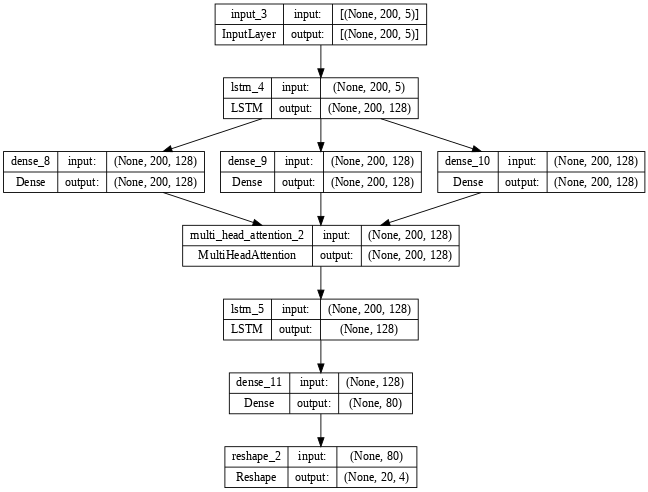

In [ ]:
# Define input shape
input_shapeaCCENTURE@ROCHE123
 = (200, 5)
# Input layer
inputs1 = Input(shape=input_shape)
lstm1 = LSTM(units=128, activation='tanh', return_sequences=True)(inputs1)

query_projection = Dense(128)(lstm1)
key_projection = Dense(128)(lstm1)
value_projection = Dense(128)(lstm1)
attention = MultiHeadAttention(num_heads=8, key_dim=128)(query_projection, key_projection, value_projection)
merged_lstm = LSTM(units=128, activation='tanh')(attention)
output = Dense(80)(merged_lstm)
reshaped_output = Reshape((20, 4))(output)

AMZN_lstm_model = Model(inputs=inputs1, outputs=reshaped_output)
AMZN_lstm_model.compile(optimizer=Adam(learning_rate=0.0002), loss='mse')
AMZN_lstm_model.summary()

tf.keras.utils.plot_model(AMZN_lstm_model, show_shapes=True, dpi=64)

Epoch 1/15
1/1 [==============================] - 0s 32ms/step


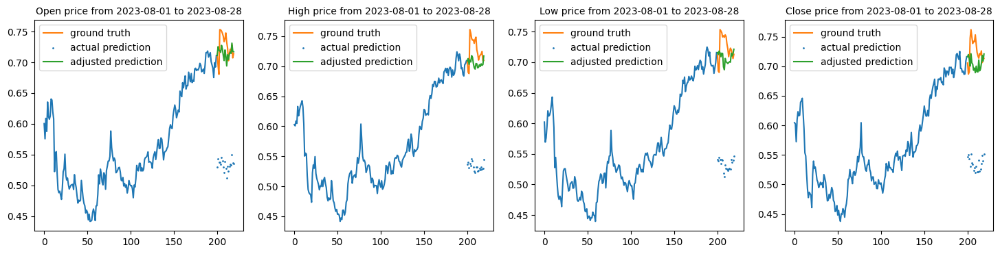

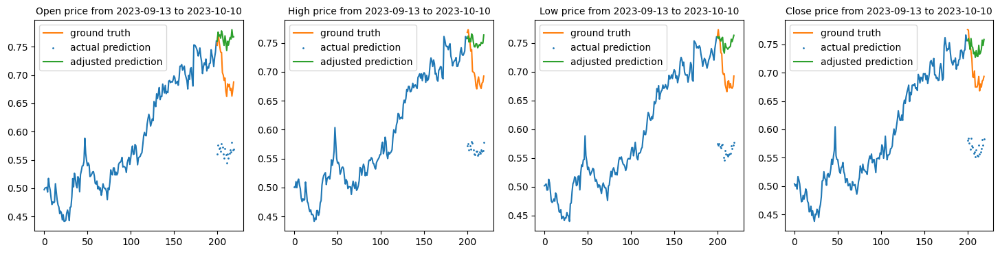

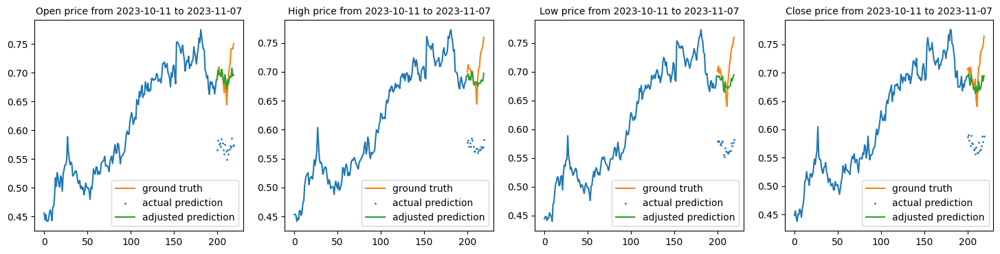

5722/5722 [==============================] - 111s 18ms/step - loss: 0.0046 - val_loss: 0.0251
Epoch 2/15
1/1 [==============================] - 0s 25ms/step


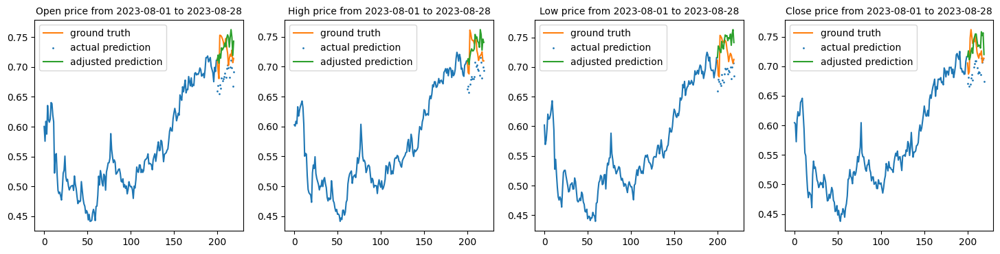

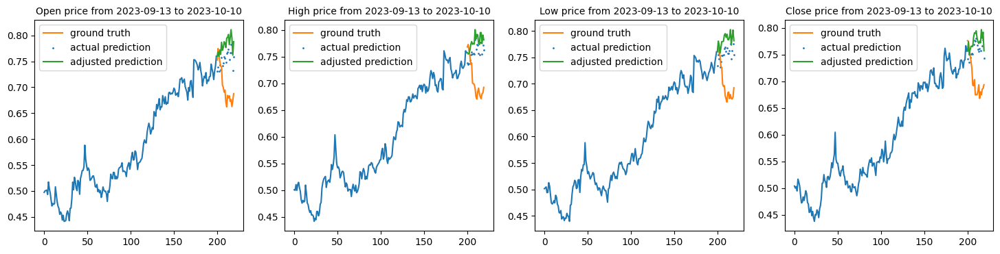

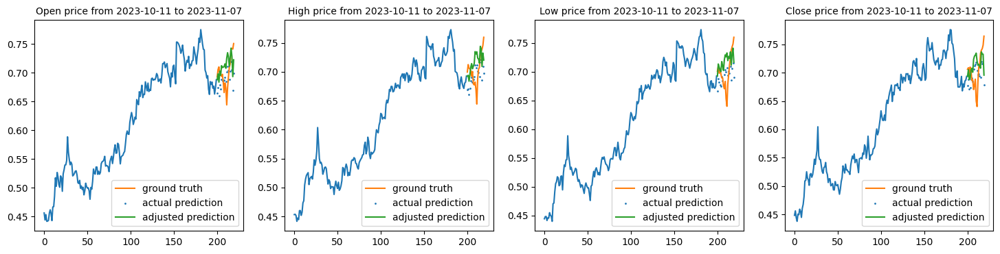

5722/5722 [==============================] - 105s 18ms/step - loss: 0.0023 - val_loss: 0.0027
Epoch 3/15
1/1 [==============================] - 0s 28ms/step


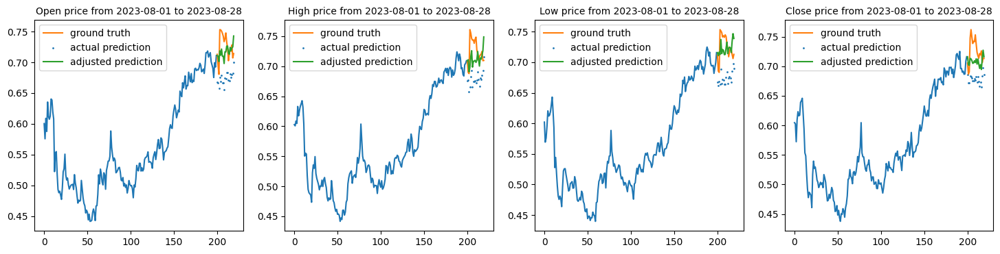

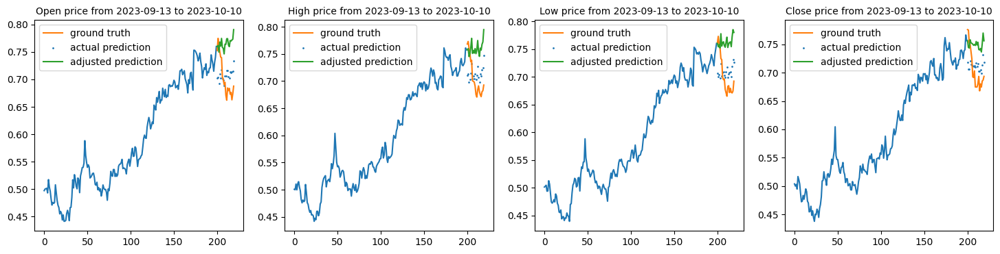

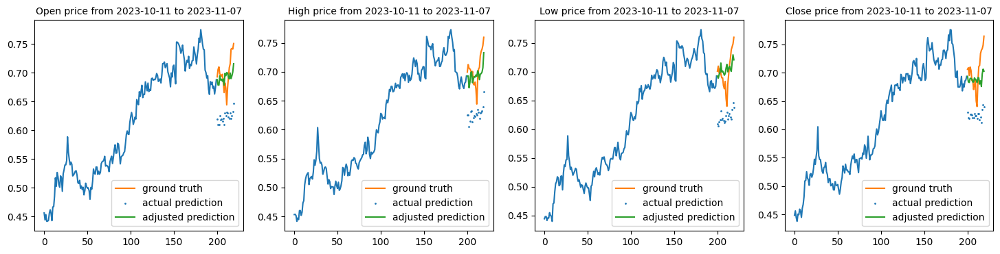

5722/5722 [==============================] - 112s 20ms/step - loss: 0.0015 - val_loss: 0.0037
Epoch 4/15
1/1 [==============================] - 0s 29ms/step


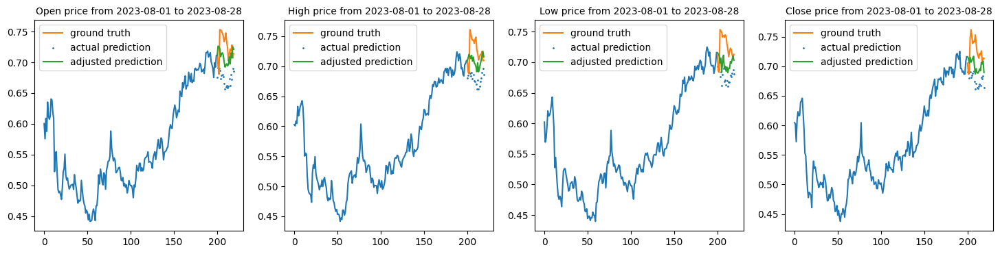

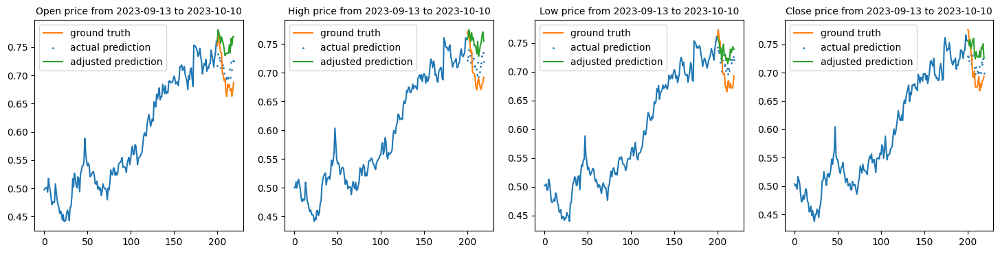

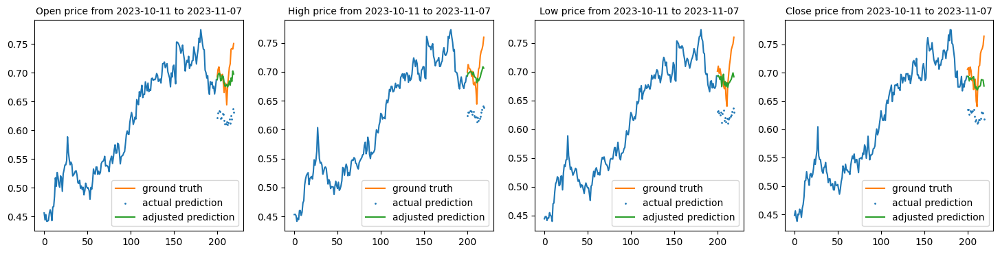

5722/5722 [==============================] - 117s 20ms/step - loss: 0.0012 - val_loss: 0.0035
Epoch 5/15
1/1 [==============================] - 0s 33ms/step


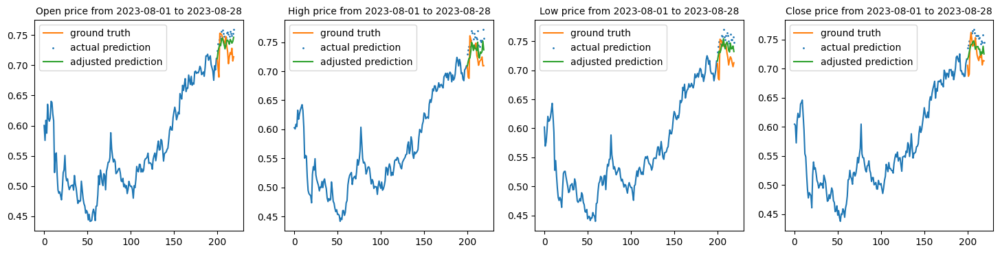

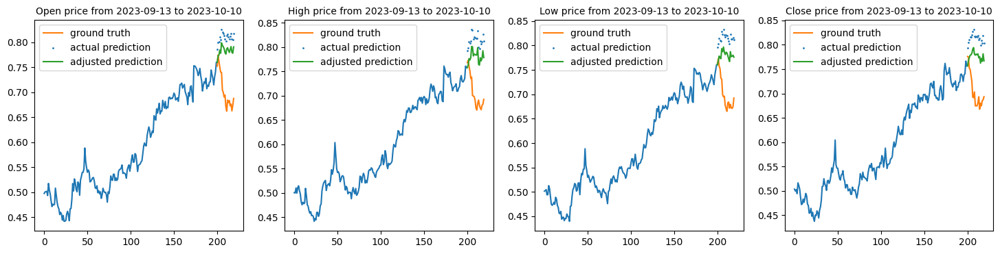

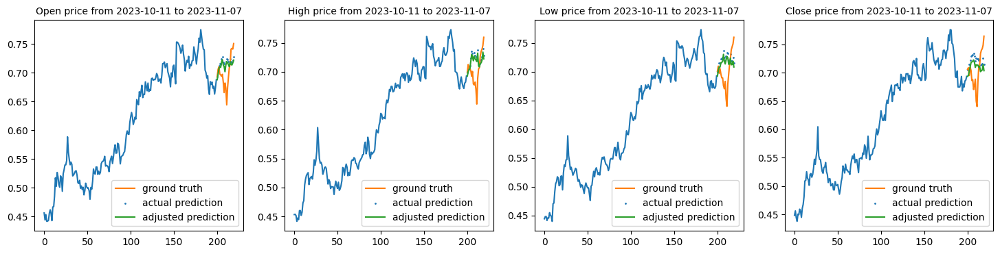

5722/5722 [==============================] - 122s 21ms/step - loss: 0.0011 - val_loss: 0.0053
Epoch 6/15
1/1 [==============================] - 0s 27ms/step


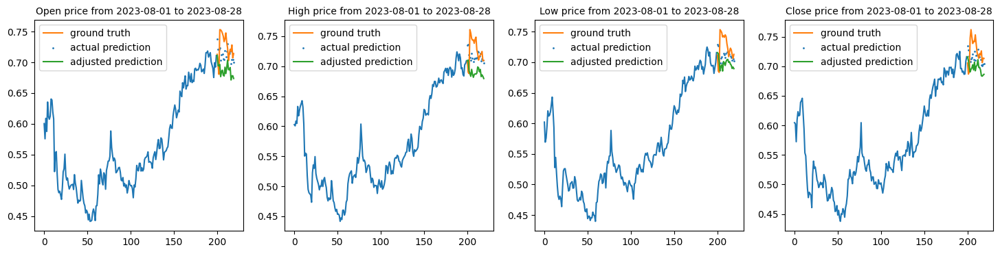

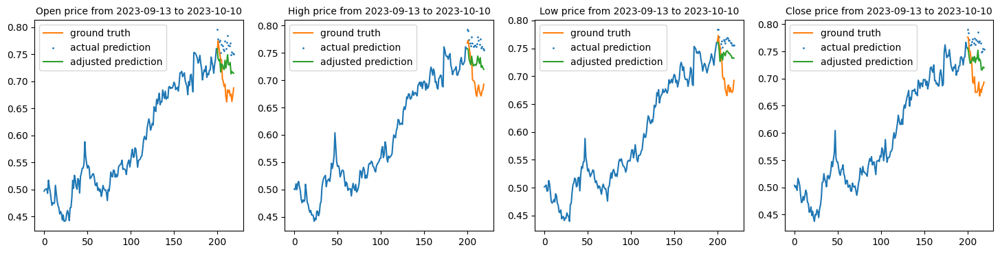

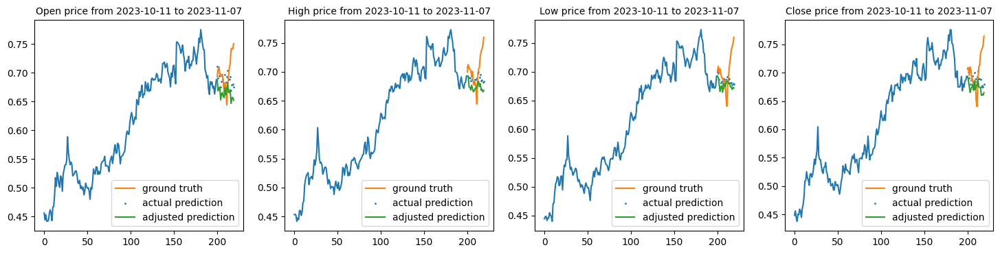

5722/5722 [==============================] - 123s 21ms/step - loss: 9.2366e-04 - val_loss: 0.0023
Epoch 7/15
1/1 [==============================] - 0s 32ms/step


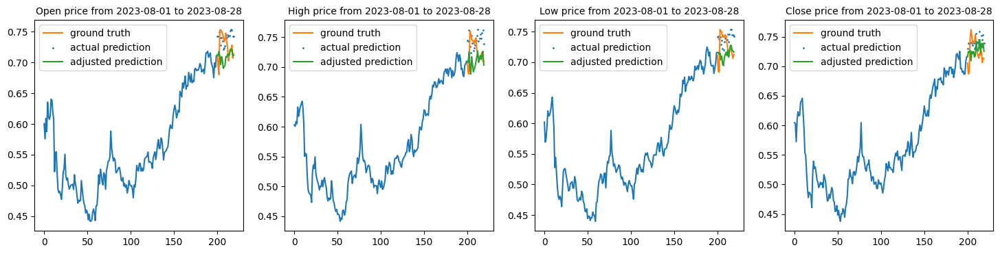

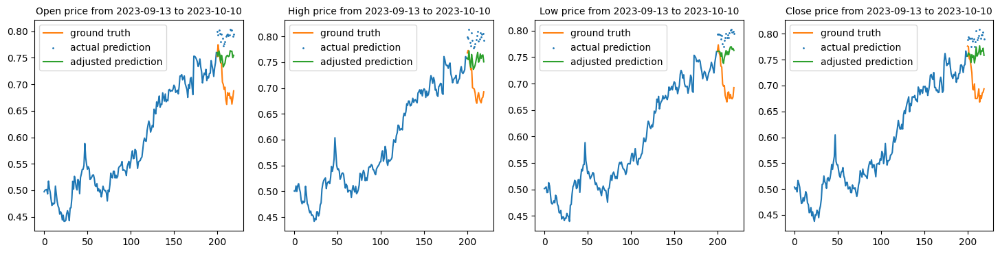

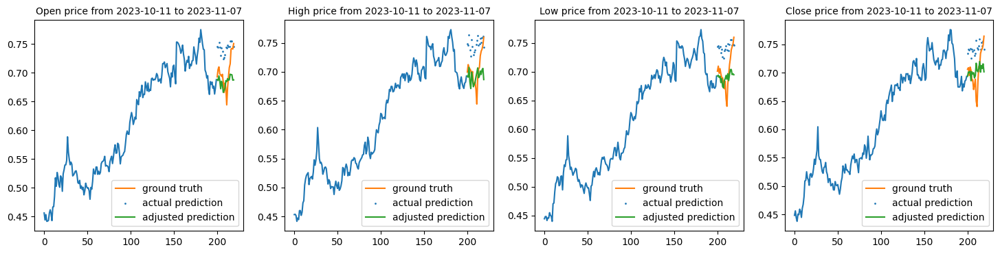

5722/5722 [==============================] - 128s 22ms/step - loss: 8.1139e-04 - val_loss: 0.0042
Epoch 8/15
1/1 [==============================] - 0s 36ms/step


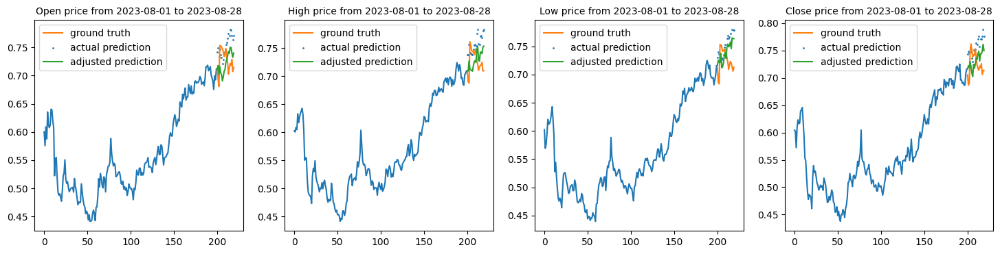

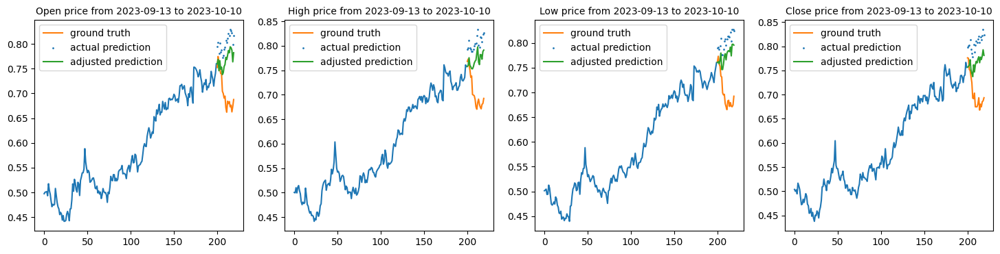

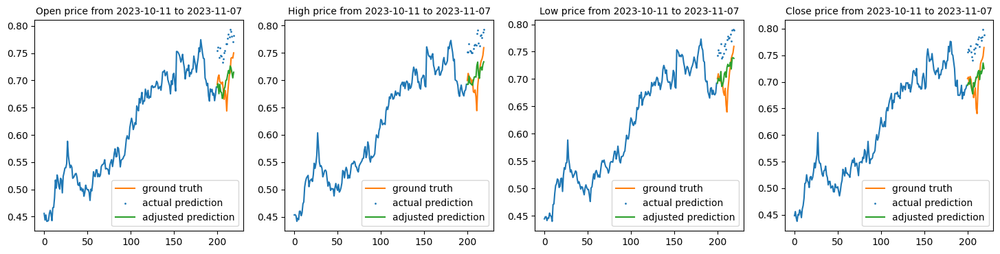

5722/5722 [==============================] - 129s 23ms/step - loss: 8.2684e-04 - val_loss: 0.0062
Epoch 9/15
1/1 [==============================] - 0s 40ms/step


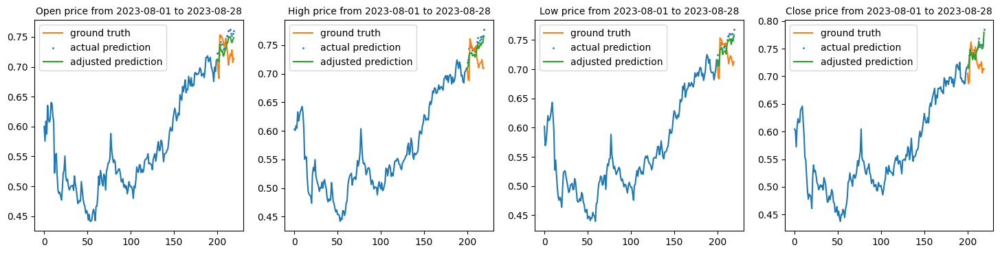

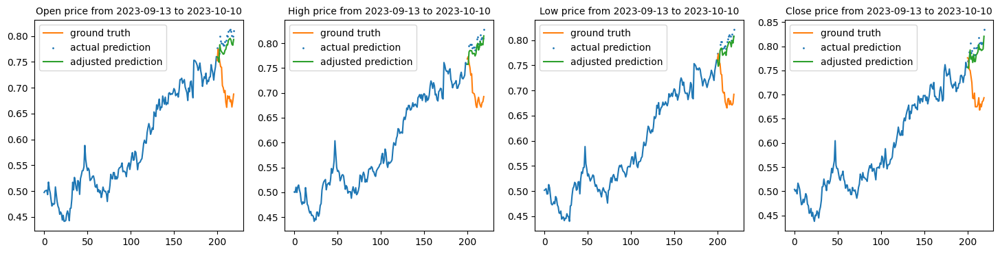

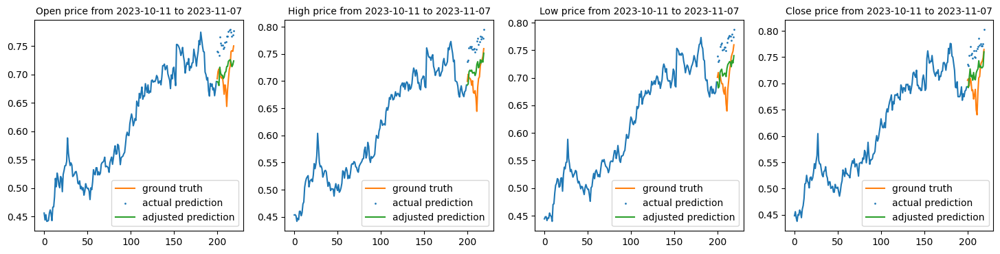

5722/5722 [==============================] - 132s 23ms/step - loss: 7.2502e-04 - val_loss: 0.0053
Epoch 10/15
1/1 [==============================] - 0s 44ms/step


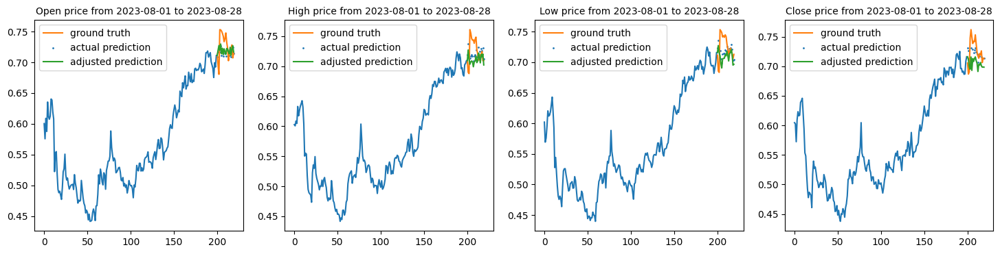

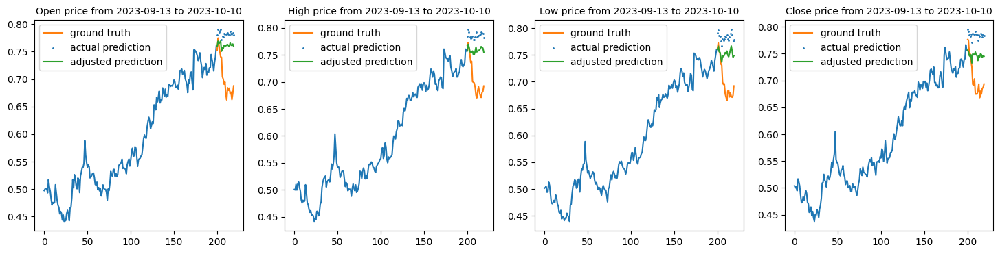

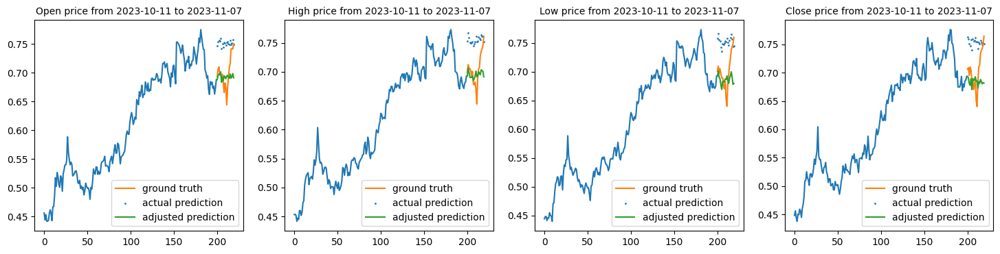

5722/5722 [==============================] - 129s 23ms/step - loss: 7.2850e-04 - val_loss: 0.0039
Epoch 11/15
1/1 [==============================] - 0s 34ms/step


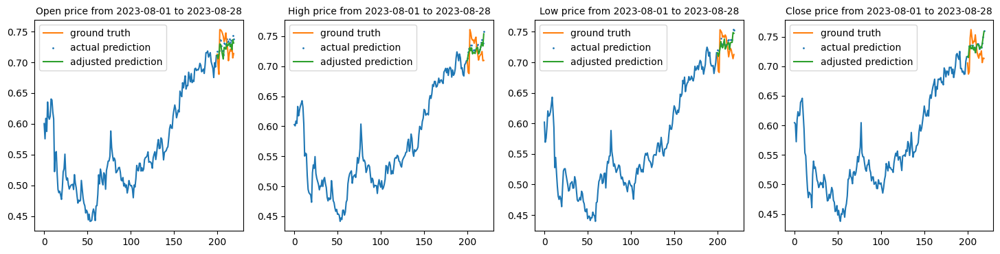

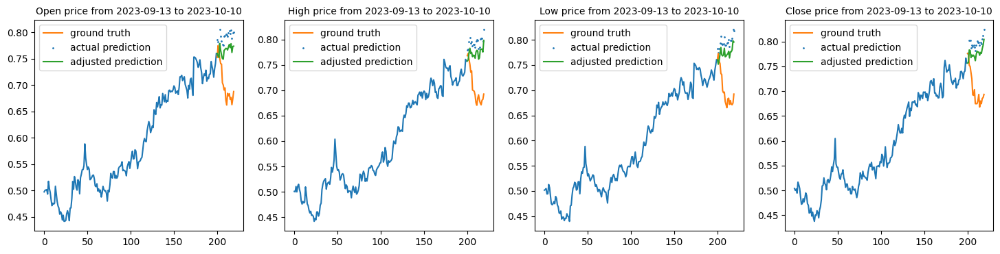

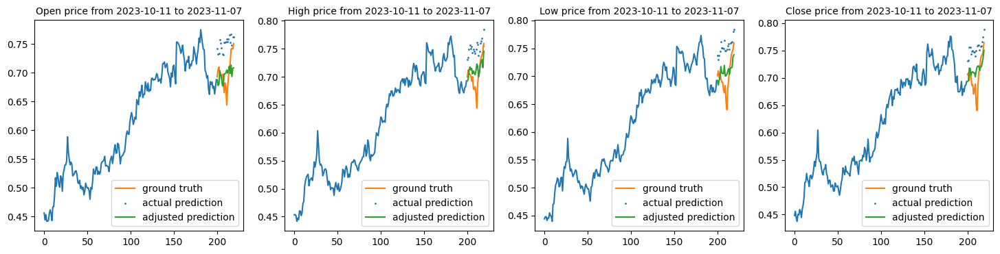

5722/5722 [==============================] - 134s 23ms/step - loss: 7.1506e-04 - val_loss: 0.0045
Epoch 12/15
1/1 [==============================] - 0s 60ms/step


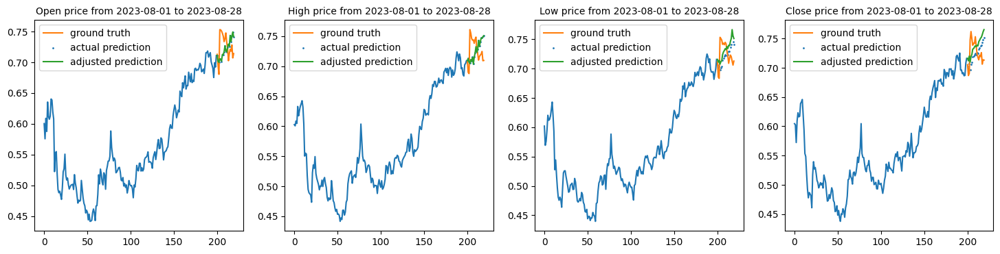

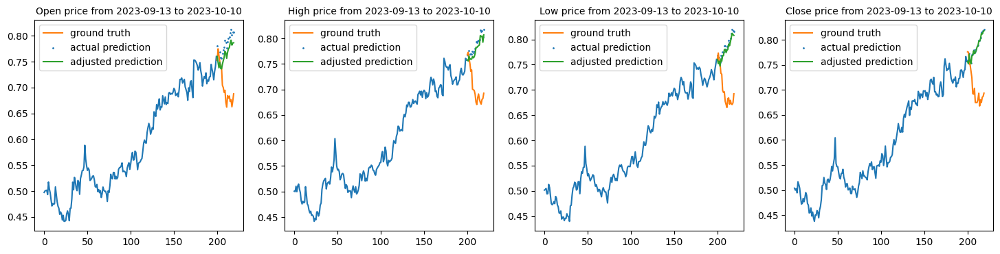

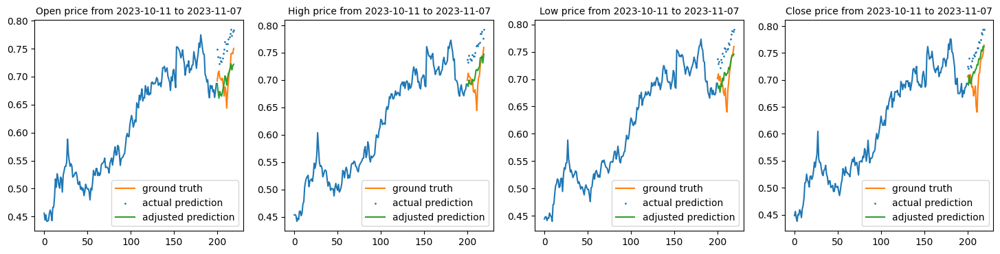

5722/5722 [==============================] - 133s 23ms/step - loss: 6.6342e-04 - val_loss: 0.0045
Epoch 13/15
1/1 [==============================] - 0s 43ms/step


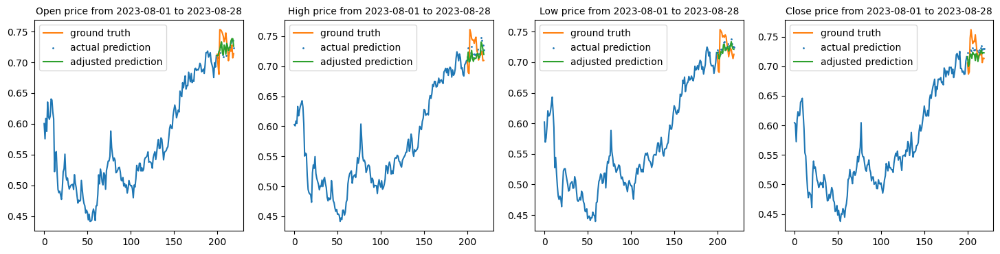

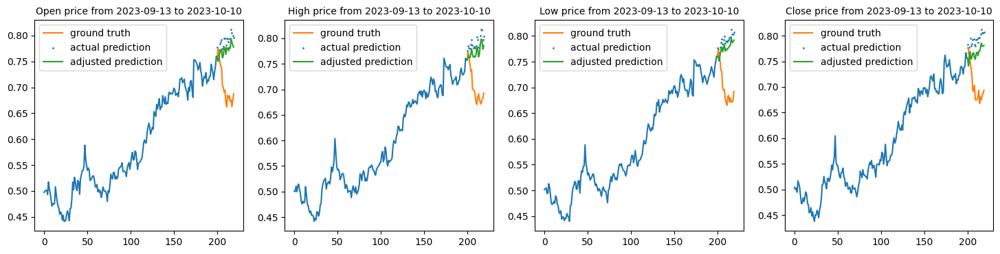

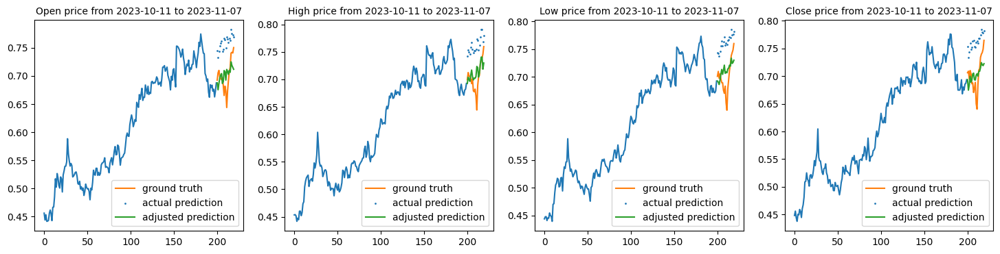

5722/5722 [==============================] - 130s 23ms/step - loss: 6.3731e-04 - val_loss: 0.0047
Epoch 14/15
1/1 [==============================] - 0s 48ms/step


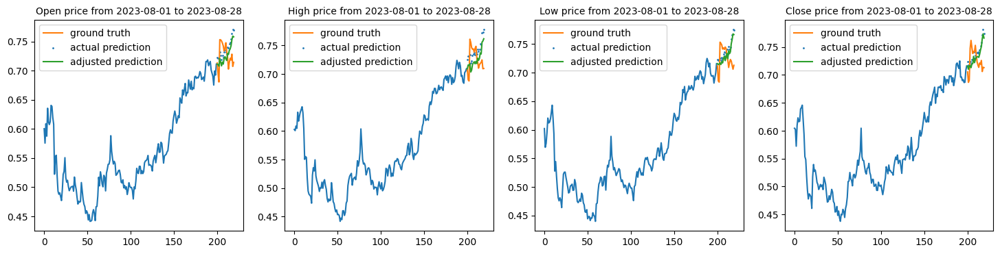

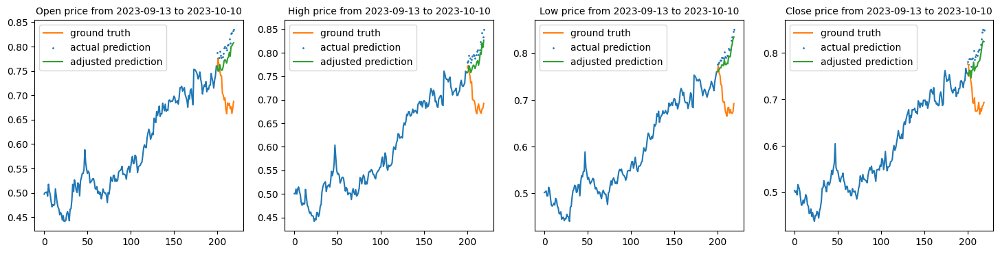

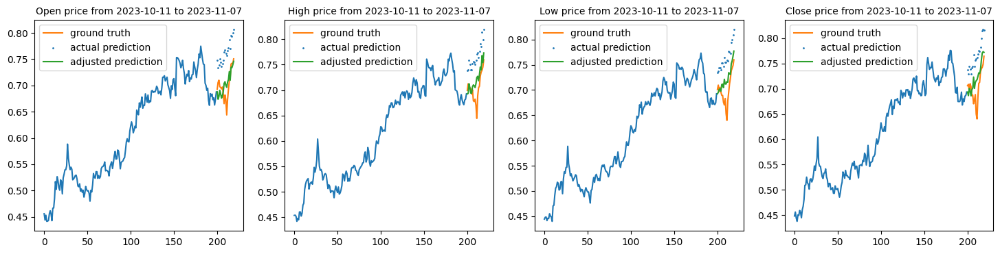

5722/5722 [==============================] - 129s 23ms/step - loss: 6.2921e-04 - val_loss: 0.0059
Epoch 15/15
1/1 [==============================] - 0s 36ms/step


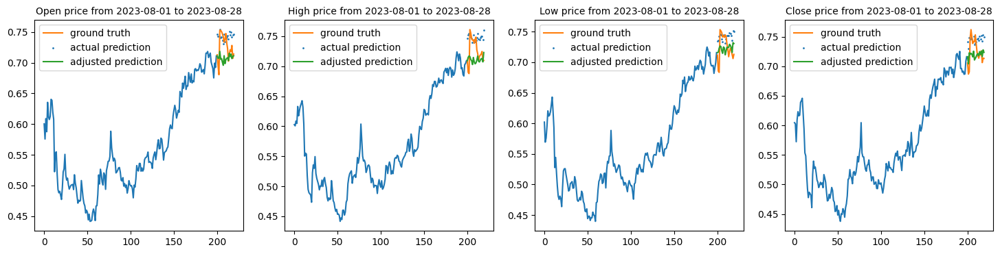

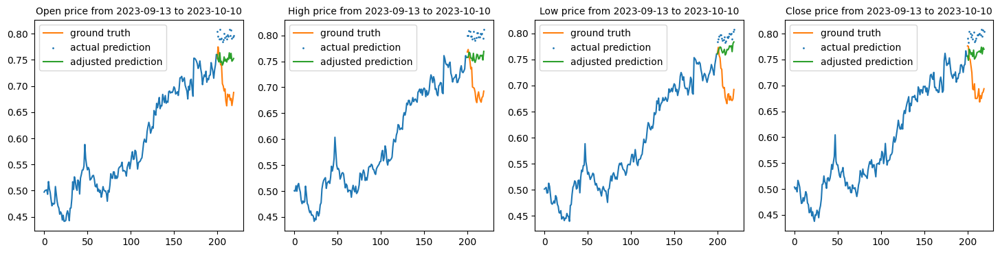

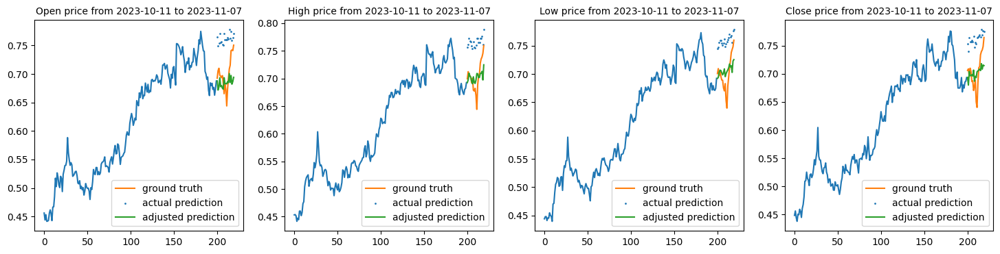

5722/5722 [==============================] - 131s 23ms/step - loss: 6.0024e-04 - val_loss: 0.0050
[0.025065183639526367, 0.0026851240545511246, 0.003711088327690959, 0.003549807472154498, 0.005277857184410095, 0.0022872898261994123, 0.004190588835626841, 0.006203969940543175, 0.005288060754537582, 0.0038723729085177183, 0.004497768823057413, 0.0044950214214622974, 0.004690616857260466, 0.005890948697924614, 0.004992244299501181]
[0.004601570777595043, 0.0023036447819322348, 0.0014580013230443, 0.0012102349428460002, 0.0010951233562082052, 0.0009236561600118876, 0.000811391684692353, 0.0008268440724350512, 0.000725023914128542, 0.0007284975727088749, 0.0007150556775741279, 0.0006634193705394864, 0.0006373111391440034, 0.0006292094476521015, 0.0006002425798214972]


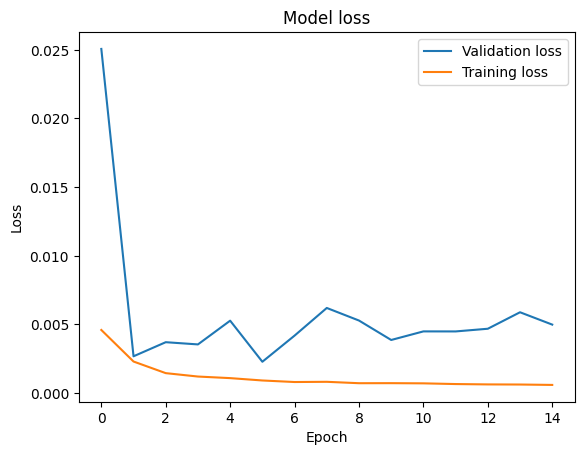

In [ ]:
AMZN_lstm_model_callback  = CustomCallback(AMZN_lstm_model, AMZN_x_test[:,:,:], SPX_x_test[:,:,:], AMZN_y_test[:,:,:5])
AMZN_lstm_model_history = AMZN_lstm_model.fit(AMZN_x_train[:,:,1:].astype('float32'), AMZN_y_train[:,:,1:5].astype('float32'), epochs=15, batch_size=1, callbacks=[AMZN_lstm_model_callback], validation_data=(AMZN_x_test[:,:,1:].astype('float32'), AMZN_y_test[:,:,1:5].astype('float32')))


print(AMZN_lstm_model_history.history['val_loss'])
print(AMZN_lstm_model_history.history['loss'])

plt.plot(AMZN_lstm_model_history.history['val_loss'])
plt.plot(AMZN_lstm_model_history.history['loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Validation loss', 'Training loss'])
plt.show()

## LSTM Model With Attention Layer- DUK

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 200, 5)]             0         []                            
                                                                                                  
 lstm_6 (LSTM)               (None, 200, 128)             68608     ['input_4[0][0]']             
                                                                                                  
 dense_12 (Dense)            (None, 200, 128)             16512     ['lstm_6[0][0]']              
                                                                                                  
 dense_13 (Dense)            (None, 200, 128)             16512     ['lstm_6[0][0]']              
                                                                                            

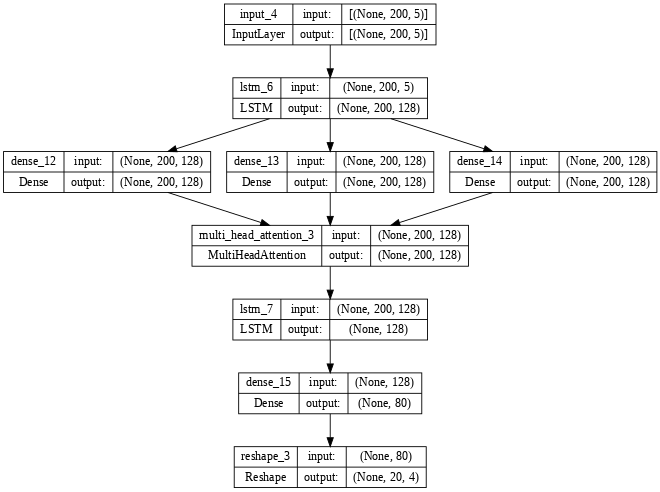

In [ ]:
# Define input shape
input_shape = (200, 5)
# Input layer
inputs1 = Input(shape=input_shape)
lstm1 = LSTM(units=128, activation='tanh', return_sequences=True)(inputs1)

query_projection = Dense(128)(lstm1)
key_projection = Dense(128)(lstm1)
value_projection = Dense(128)(lstm1)
attention = MultiHeadAttention(num_heads=8, key_dim=128)(query_projection, key_projection, value_projection)
merged_lstm = LSTM(units=128, activation='tanh')(attention)
output = Dense(80)(merged_lstm)
reshaped_output = Reshape((20, 4))(output)

DUK_lstm_model = Model(inputs=inputs1, outputs=reshaped_output)
DUK_lstm_model.compile(optimizer=Adam(learning_rate=0.0002), loss='mse')
DUK_lstm_model.summary()

tf.keras.utils.plot_model(DUK_lstm_model, show_shapes=True, dpi=64)

Epoch 1/15
1/1 [==============================] - 0s 32ms/step


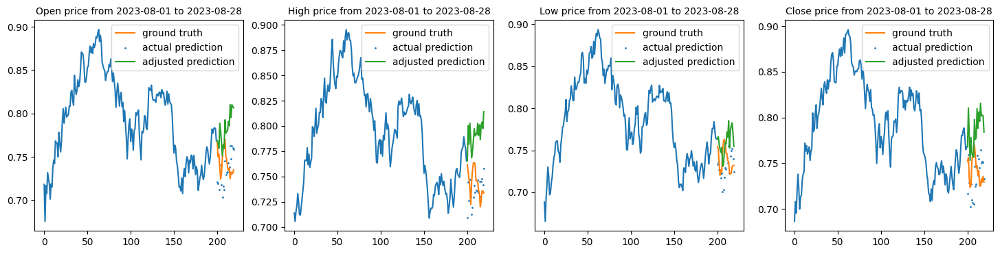

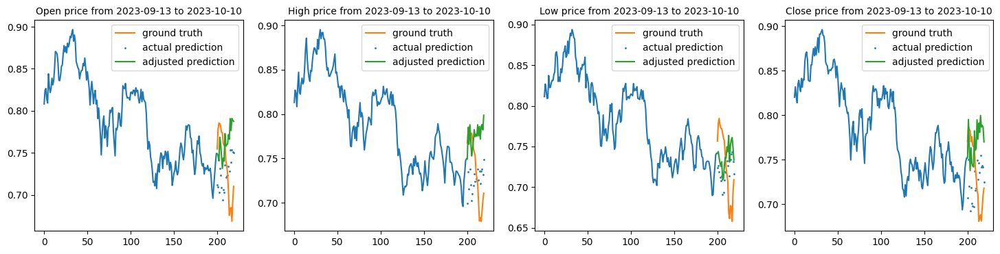

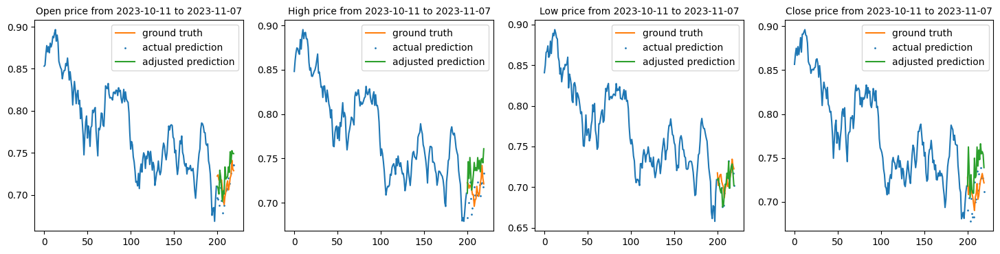

5722/5722 [==============================] - 139s 23ms/step - loss: 0.0054 - val_loss: 0.0012
Epoch 2/15
1/1 [==============================] - 0s 34ms/step


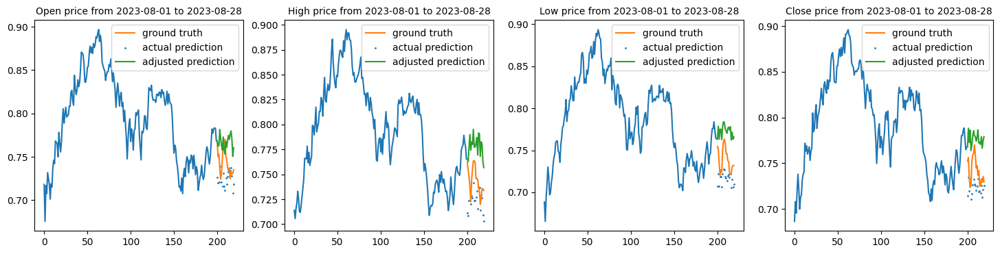

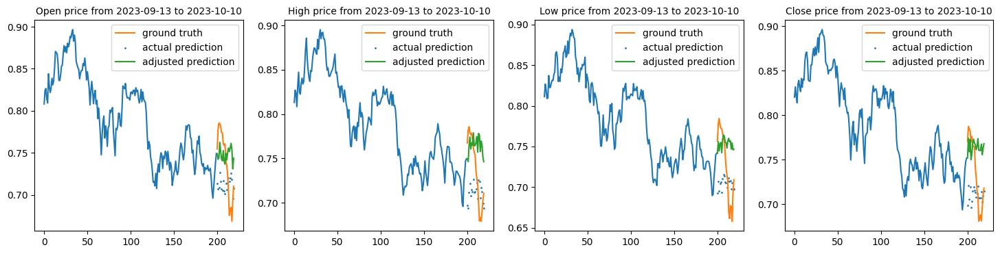

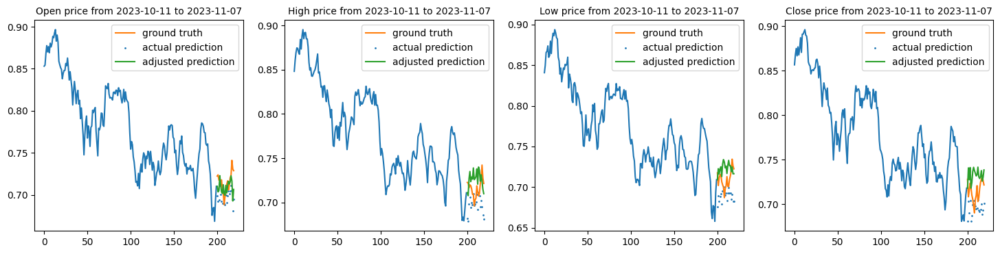

5722/5722 [==============================] - 125s 22ms/step - loss: 0.0031 - val_loss: 0.0012
Epoch 3/15
1/1 [==============================] - 0s 26ms/step


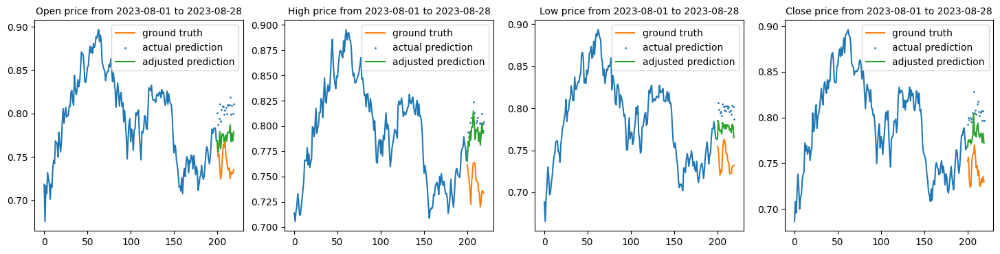

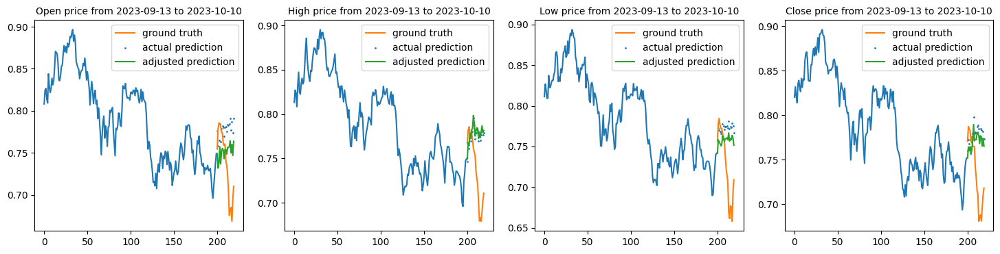

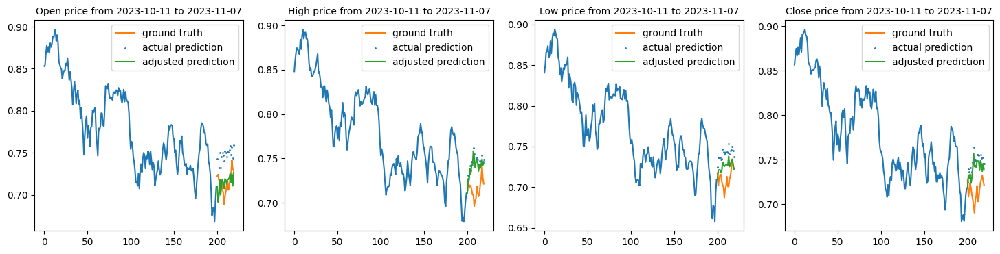

5722/5722 [==============================] - 118s 21ms/step - loss: 0.0017 - val_loss: 0.0029
Epoch 4/15
1/1 [==============================] - 0s 32ms/step


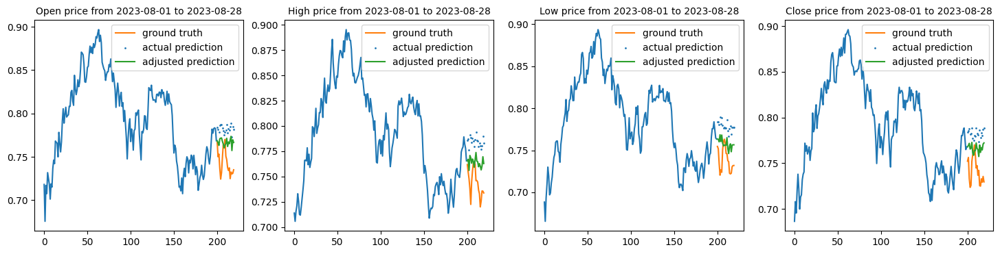

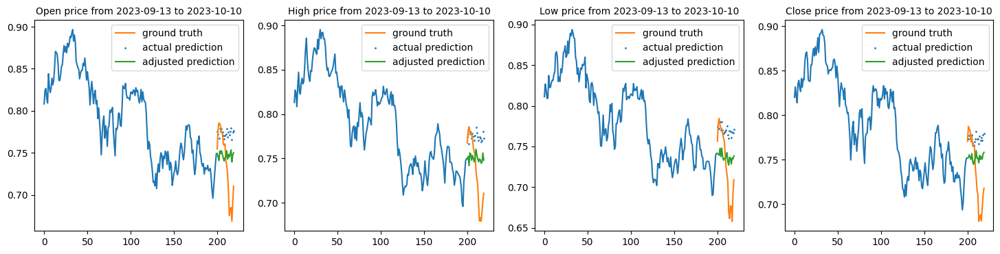

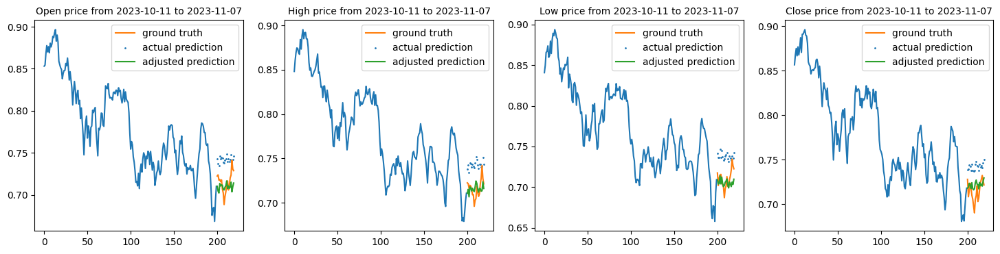

5722/5722 [==============================] - 113s 20ms/step - loss: 0.0014 - val_loss: 0.0019
Epoch 5/15
1/1 [==============================] - 0s 24ms/step


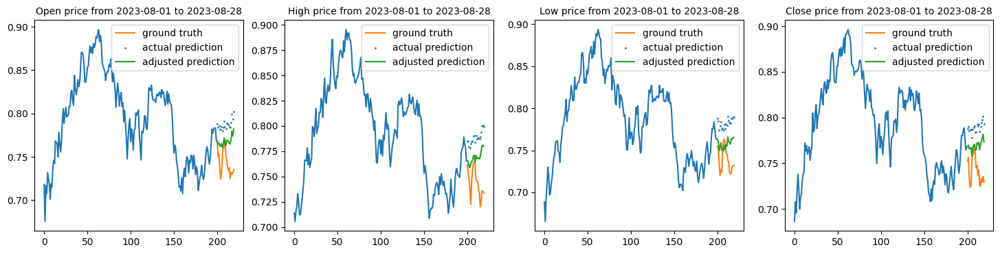

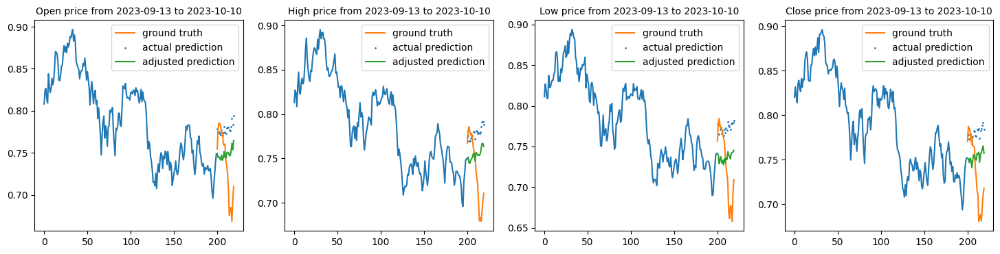

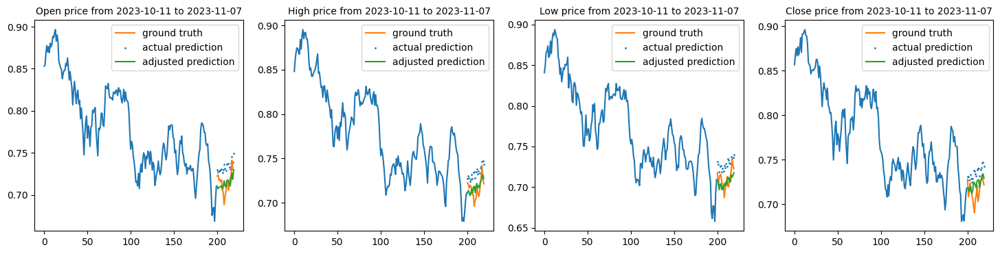

5722/5722 [==============================] - 116s 20ms/step - loss: 0.0014 - val_loss: 0.0022
Epoch 6/15
1/1 [==============================] - 0s 21ms/step


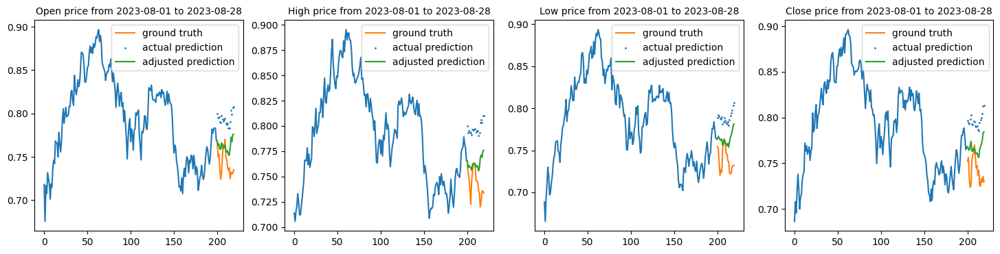

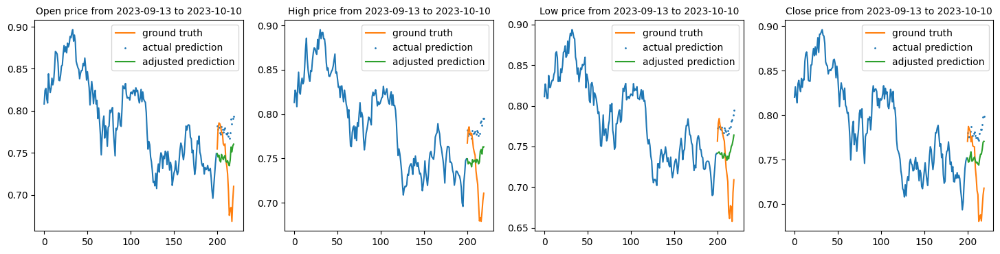

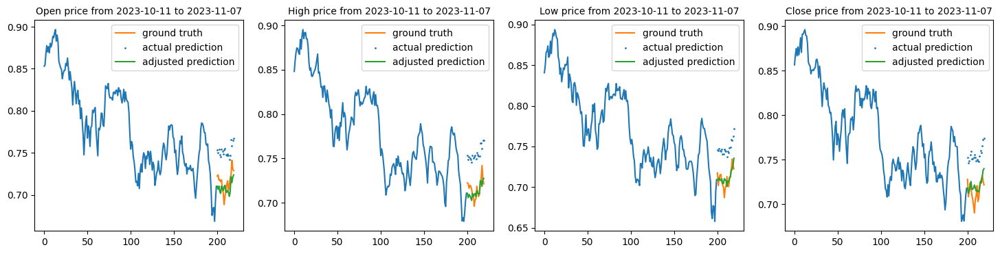

5722/5722 [==============================] - 118s 21ms/step - loss: 0.0013 - val_loss: 0.0028
Epoch 7/15
1/1 [==============================] - 0s 35ms/step


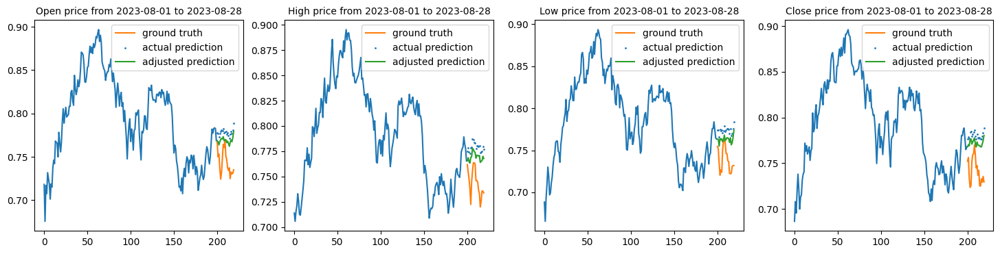

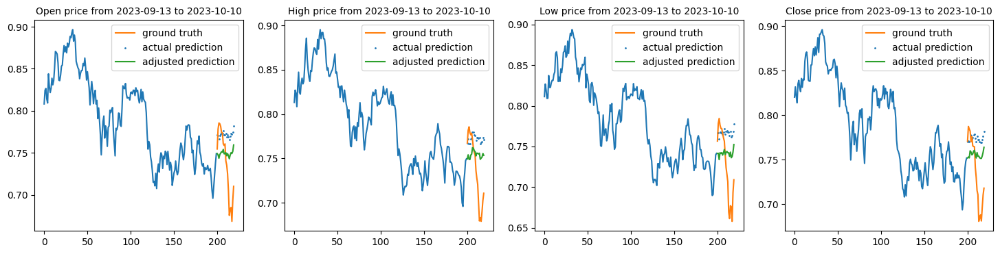

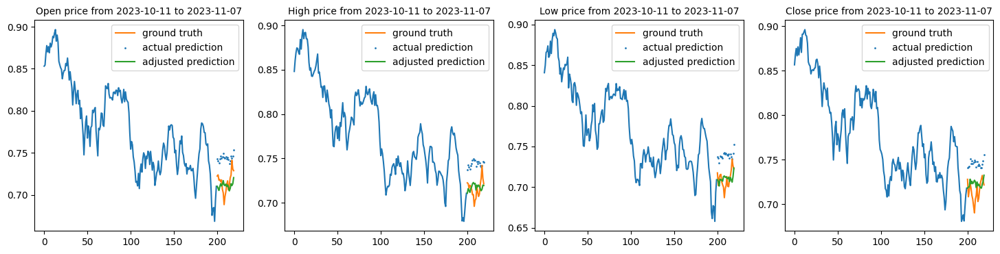

5722/5722 [==============================] - 122s 21ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 8/15
1/1 [==============================] - 0s 22ms/step


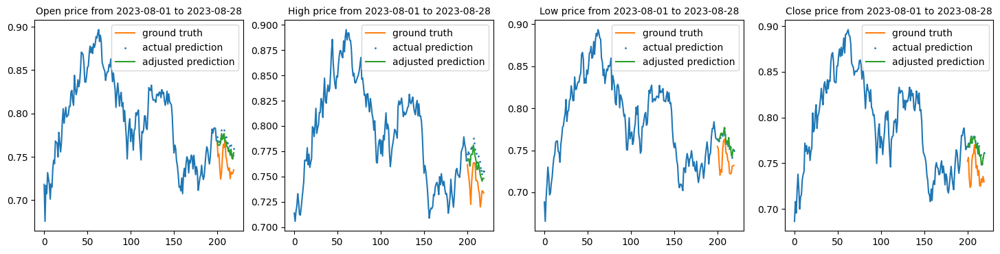

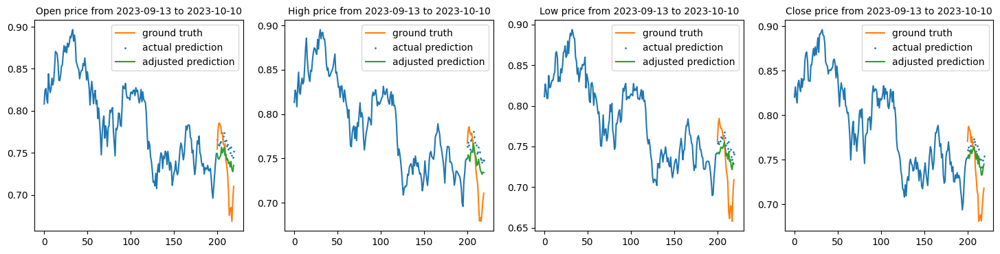

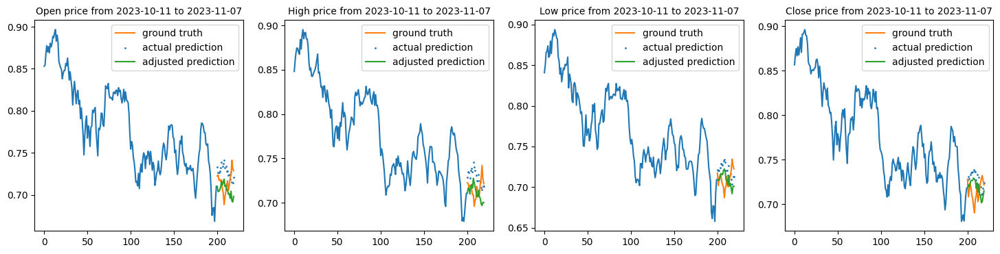

5722/5722 [==============================] - 123s 21ms/step - loss: 0.0012 - val_loss: 9.4905e-04
Epoch 9/15
1/1 [==============================] - 0s 64ms/step


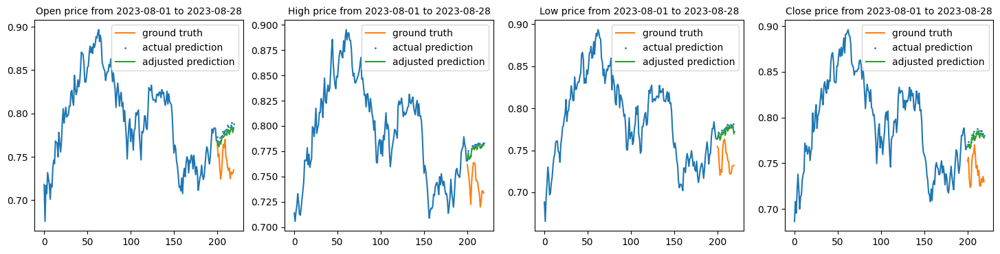

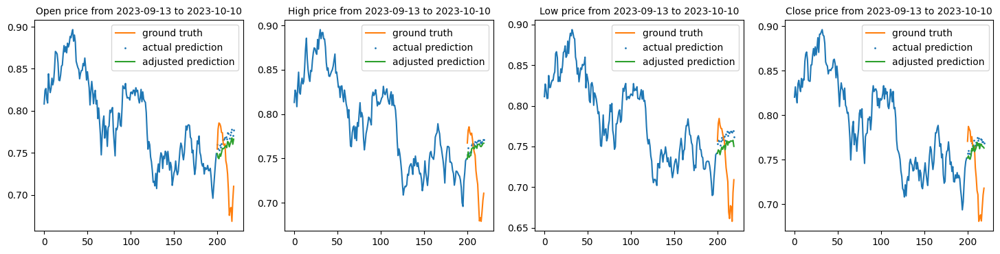

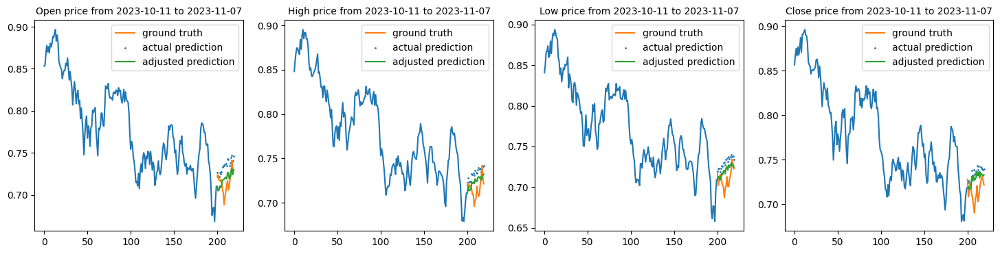

5722/5722 [==============================] - 123s 21ms/step - loss: 0.0012 - val_loss: 0.0017
Epoch 10/15
1/1 [==============================] - 0s 47ms/step


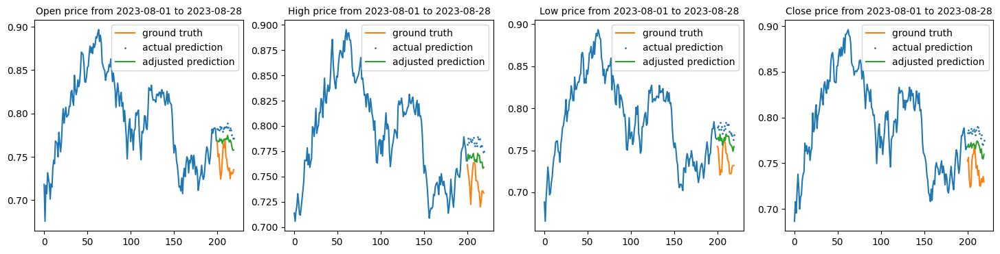

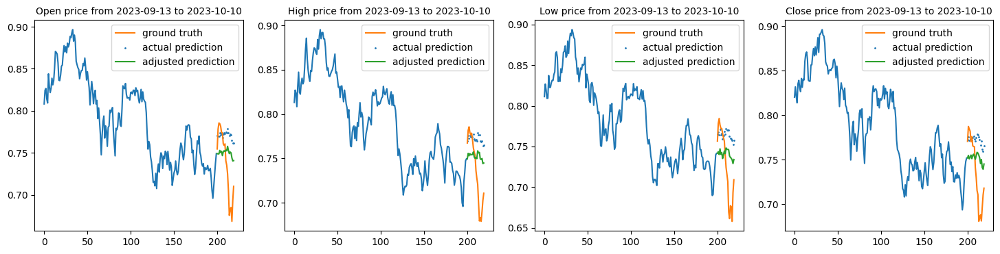

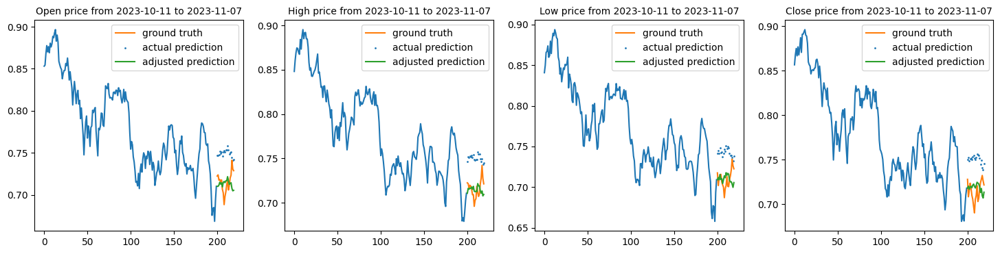

5722/5722 [==============================] - 120s 21ms/step - loss: 0.0011 - val_loss: 0.0019
Epoch 11/15
1/1 [==============================] - 0s 34ms/step


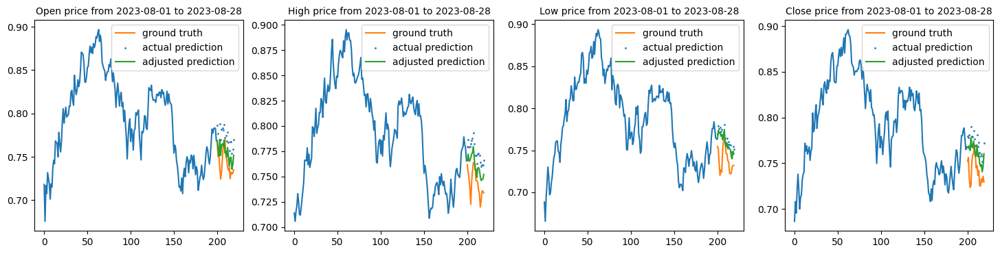

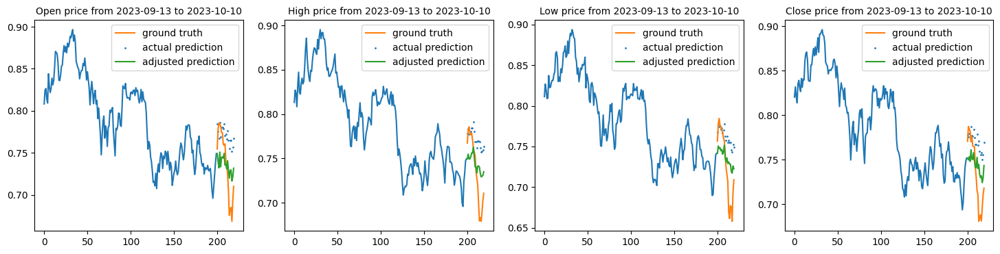

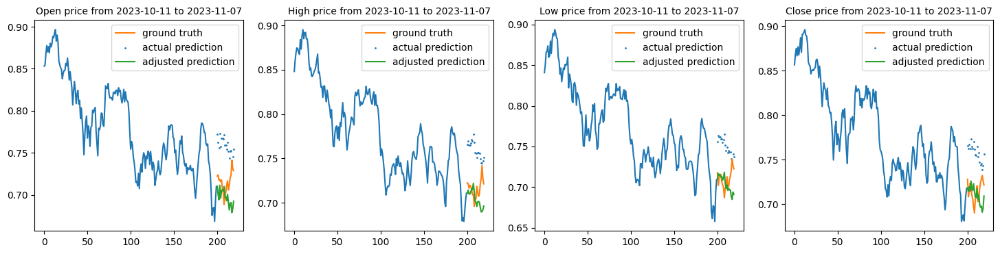

5722/5722 [==============================] - 123s 21ms/step - loss: 0.0011 - val_loss: 0.0018
Epoch 12/15
1/1 [==============================] - 0s 35ms/step


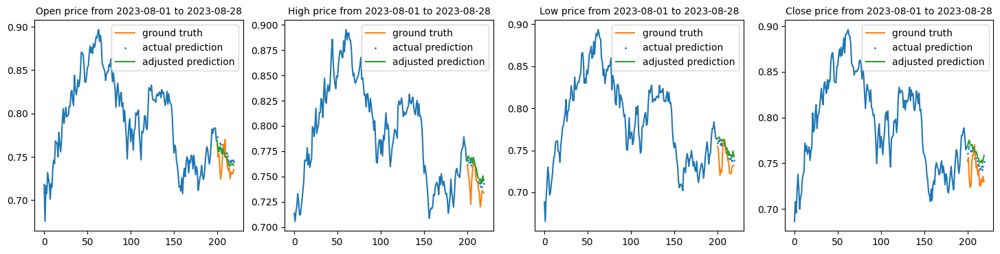

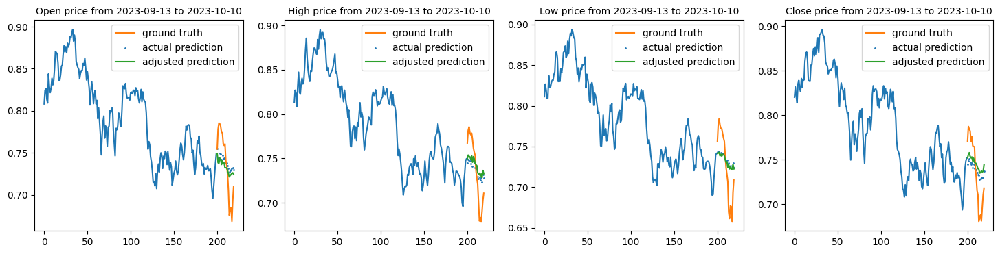

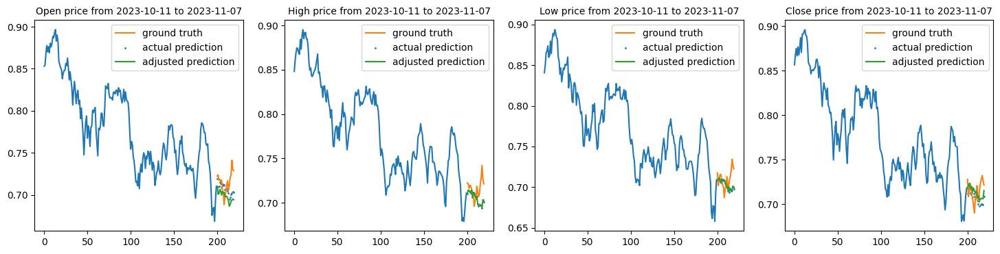

5722/5722 [==============================] - 123s 21ms/step - loss: 0.0011 - val_loss: 5.3245e-04
Epoch 13/15
1/1 [==============================] - 0s 31ms/step


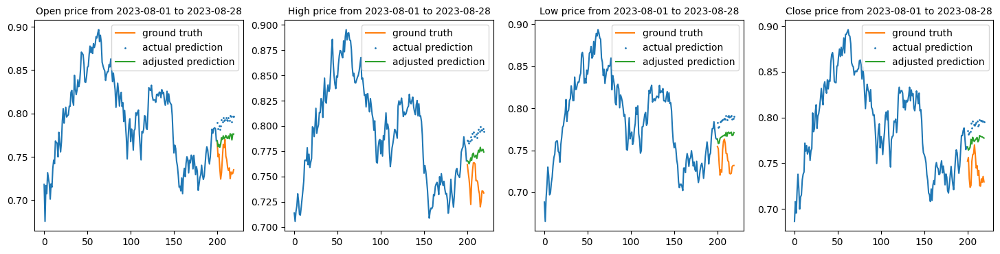

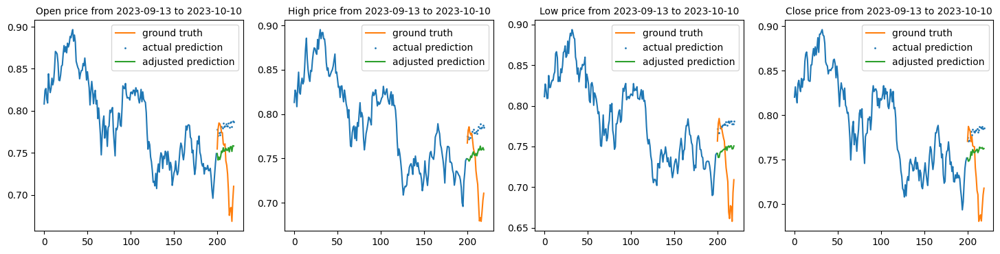

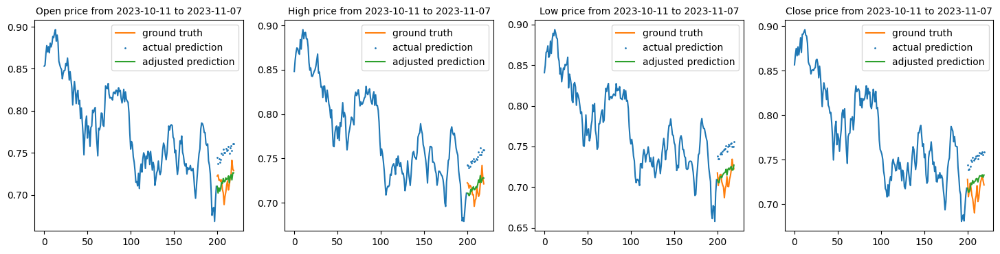

5722/5722 [==============================] - 122s 21ms/step - loss: 0.0011 - val_loss: 0.0026
Epoch 14/15
1/1 [==============================] - 0s 32ms/step


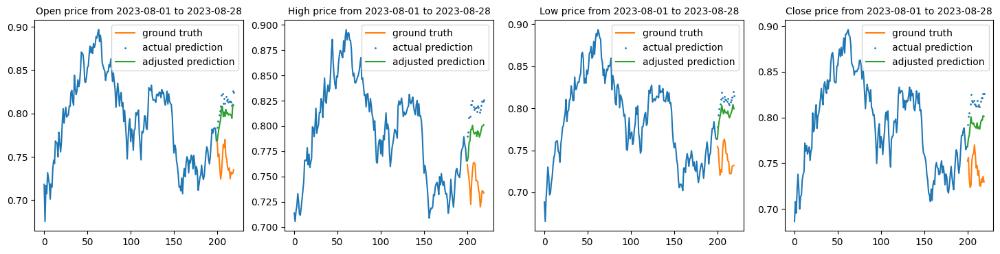

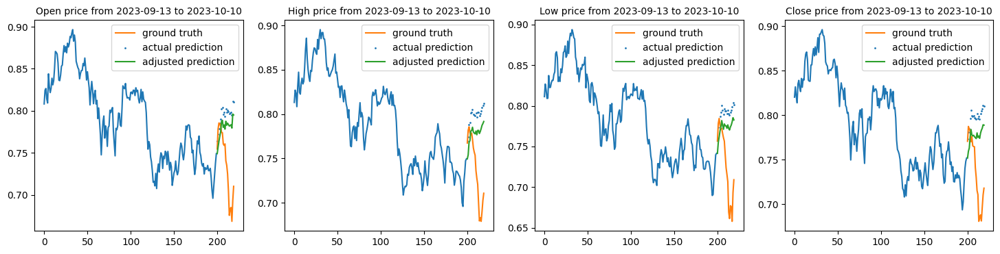

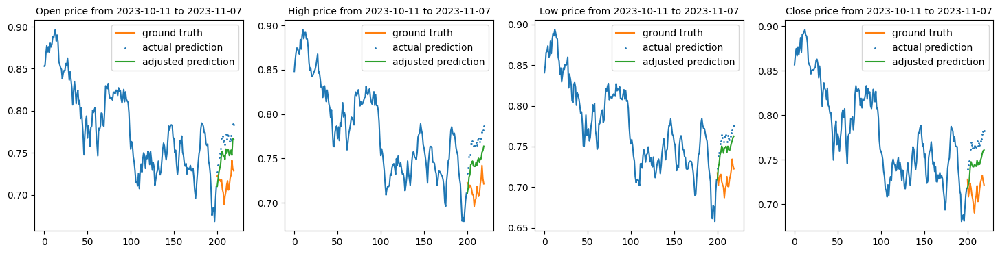

5722/5722 [==============================] - 123s 22ms/step - loss: 0.0011 - val_loss: 0.0046
Epoch 15/15
1/1 [==============================] - 0s 32ms/step


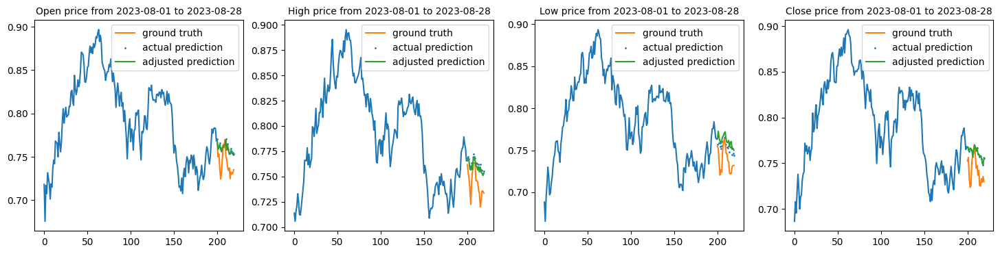

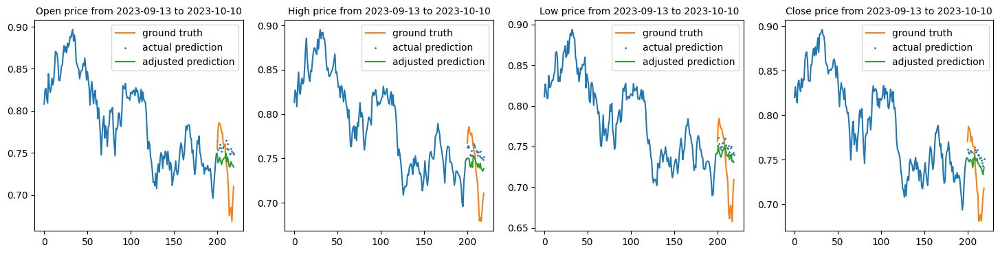

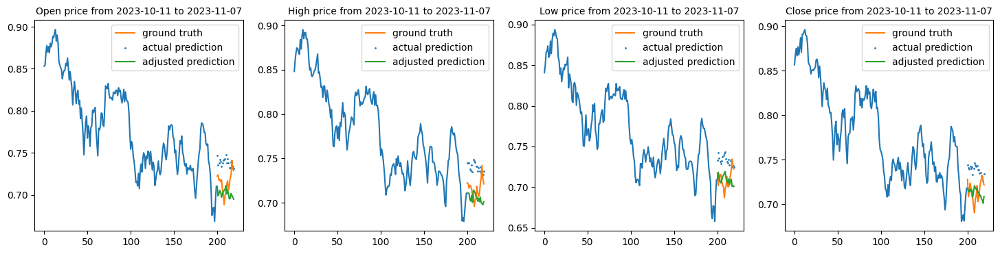

5722/5722 [==============================] - 125s 22ms/step - loss: 0.0011 - val_loss: 9.8361e-04
[0.001226981752552092, 0.0011722976341843605, 0.002863537287339568, 0.0018895085668191314, 0.002156043192371726, 0.002788064768537879, 0.0017823578091338277, 0.0009490529191680253, 0.0016562050441280007, 0.0019119934877380729, 0.0017724778736010194, 0.0005324525409378111, 0.002640269696712494, 0.004580214153975248, 0.000983613426797092]
[0.005367884412407875, 0.0031025416683405638, 0.00170556188095361, 0.0014390902360901237, 0.00141085684299469, 0.0012622373178601265, 0.0012337947264313698, 0.0012295448686927557, 0.0011834705946967006, 0.0011437541106715798, 0.001143953064456582, 0.0011021503014490008, 0.0011060923570767045, 0.0010940834181383252, 0.0010769086657091975]


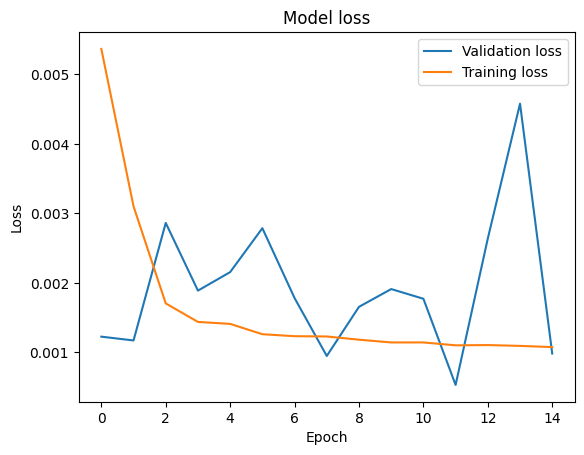

In [ ]:
DUK_lstm_model_callback  = CustomCallback(DUK_lstm_model, DUK_x_test[:,:,:], SPX_x_test[:,:,:], DUK_y_test[:,:,:5])
DUK_lstm_model_history = DUK_lstm_model.fit(DUK_x_train[:,:,1:].astype('float32'), DUK_y_train[:,:,1:5].astype('float32'), epochs=15, batch_size=1, callbacks=[DUK_lstm_model_callback], validation_data=(DUK_x_test[:,:,1:].astype('float32'), DUK_y_test[:,:,1:5].astype('float32')))


print(DUK_lstm_model_history.history['val_loss'])
print(DUK_lstm_model_history.history['loss'])

plt.plot(DUK_lstm_model_history.history['val_loss'])
plt.plot(DUK_lstm_model_history.history['loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Validation loss', 'Training loss'])
plt.show()

## LSTM Model With Attention Layer- AAPL

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_5 (InputLayer)        [(None, 200, 5)]             0         []                            
                                                                                                  
 lstm_8 (LSTM)               (None, 200, 128)             68608     ['input_5[0][0]']             
                                                                                                  
 dense_16 (Dense)            (None, 200, 128)             16512     ['lstm_8[0][0]']              
                                                                                                  
 dense_17 (Dense)            (None, 200, 128)             16512     ['lstm_8[0][0]']              
                                                                                            

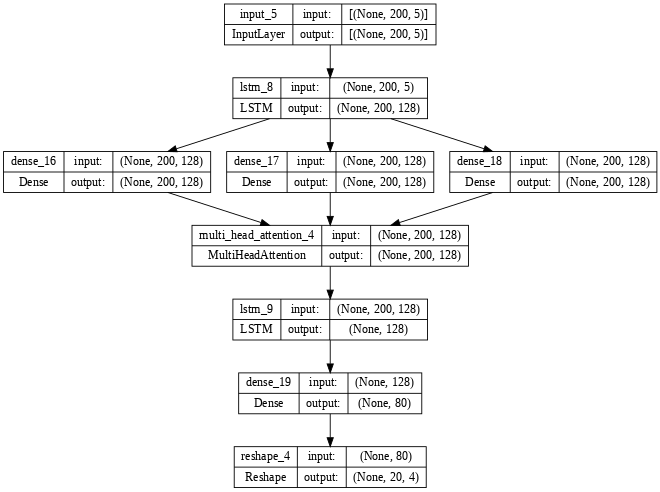

In [ ]:
# Define input shape
input_shape = (200, 5)
# Input layer
inputs1 = Input(shape=input_shape)
lstm1 = LSTM(units=128, activation='tanh', return_sequences=True)(inputs1)

query_projection = Dense(128)(lstm1)
key_projection = Dense(128)(lstm1)
value_projection = Dense(128)(lstm1)
attention = MultiHeadAttention(num_heads=8, key_dim=128)(query_projection, key_projection, value_projection)
merged_lstm = LSTM(units=128, activation='tanh')(attention)
output = Dense(80)(merged_lstm)
reshaped_output = Reshape((20, 4))(output)

AAPL_lstm_model = Model(inputs=inputs1, outputs=reshaped_output)
AAPL_lstm_model.compile(optimizer=Adam(learning_rate=0.0002), loss='mse')
AAPL_lstm_model.summary()

tf.keras.utils.plot_model(AAPL_lstm_model, show_shapes=True, dpi=64)

Epoch 1/15
1/1 [==============================] - 0s 35ms/step


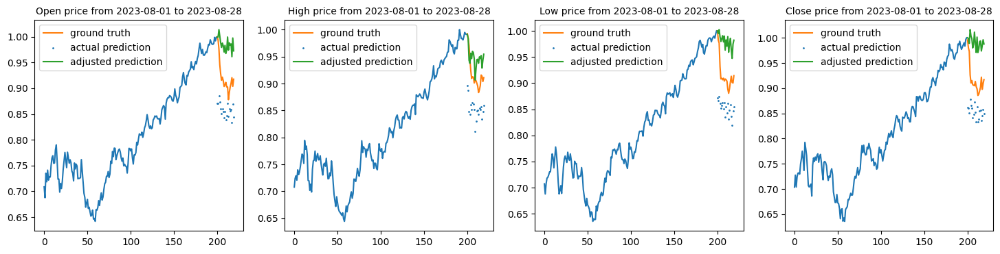

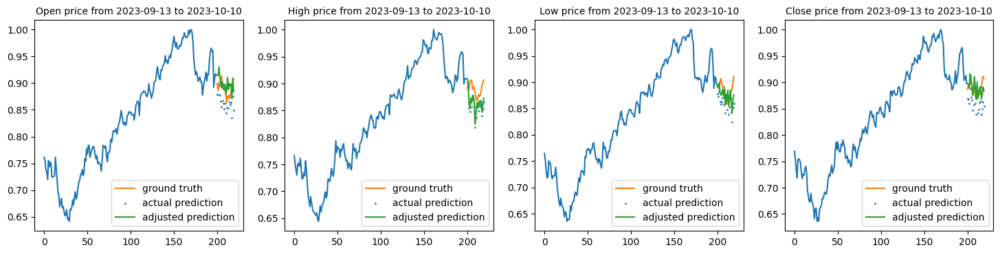

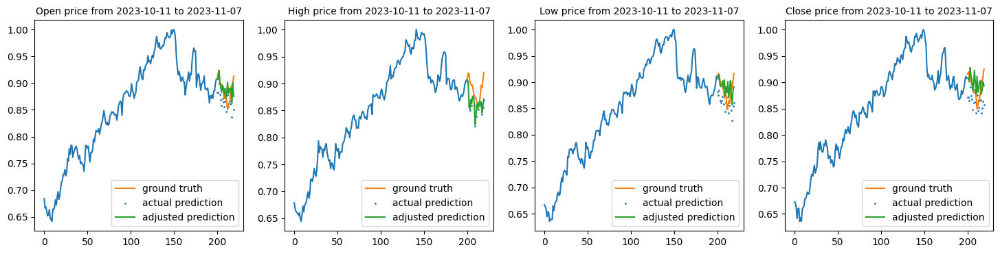

5722/5722 [==============================] - 138s 23ms/step - loss: 0.0021 - val_loss: 0.0024
Epoch 2/15
1/1 [==============================] - 0s 47ms/step


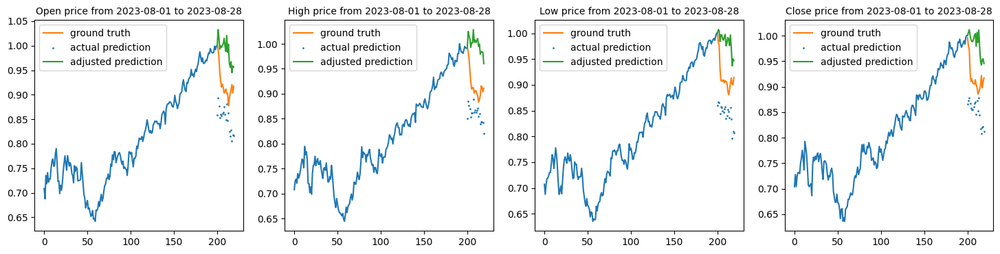

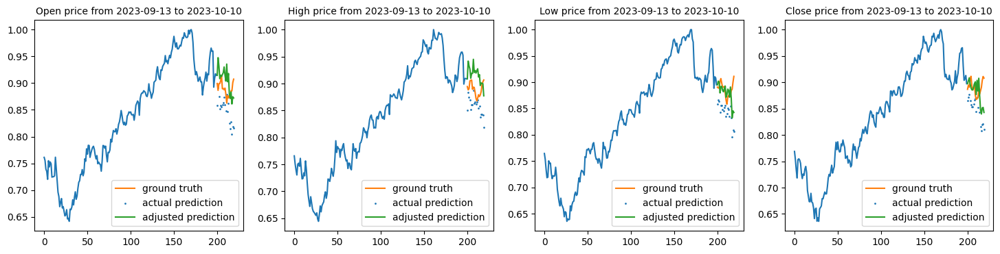

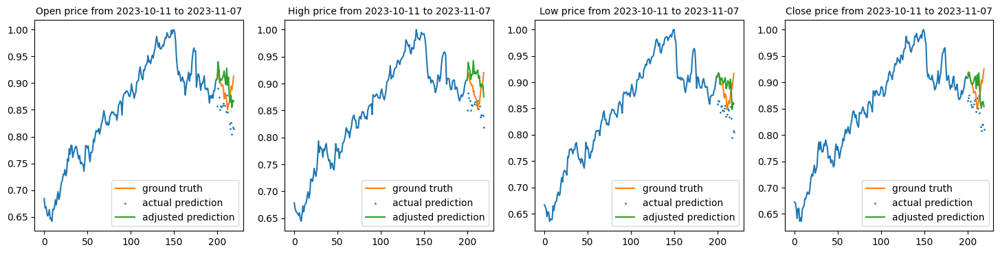

5722/5722 [==============================] - 126s 22ms/step - loss: 0.0014 - val_loss: 0.0034
Epoch 3/15
1/1 [==============================] - 0s 34ms/step


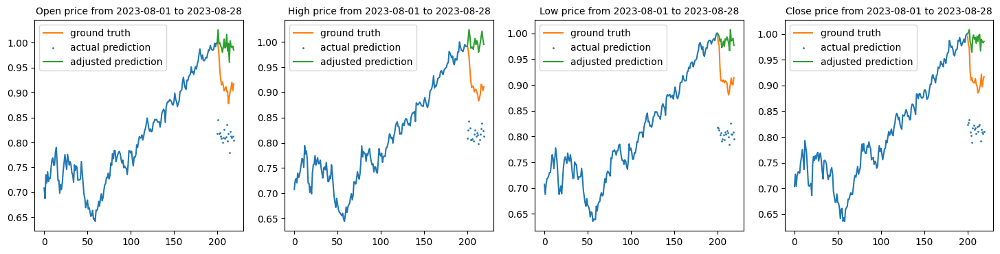

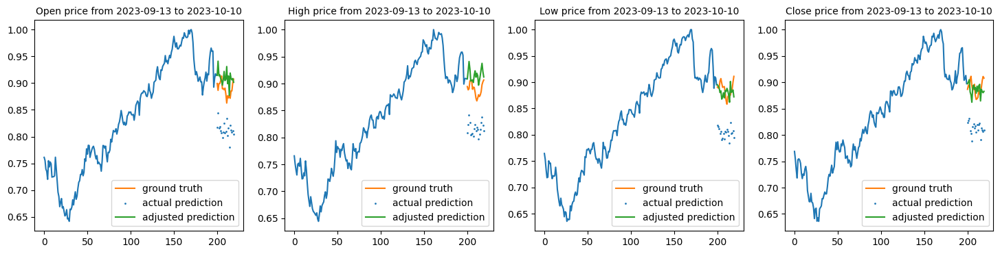

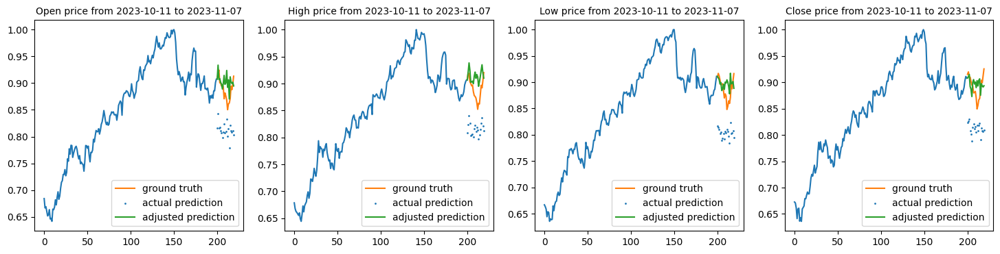

5722/5722 [==============================] - 132s 23ms/step - loss: 0.0012 - val_loss: 0.0084
Epoch 4/15
1/1 [==============================] - 0s 41ms/step


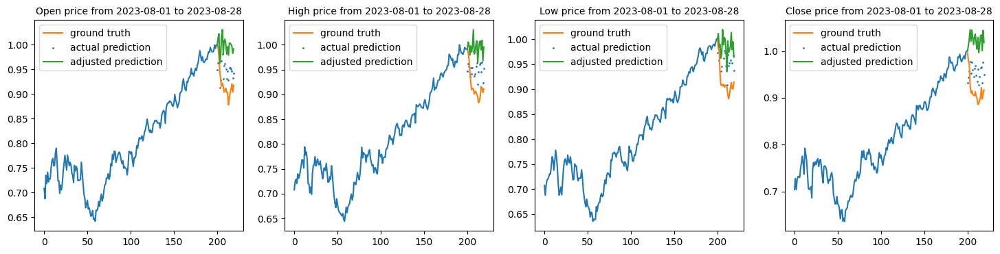

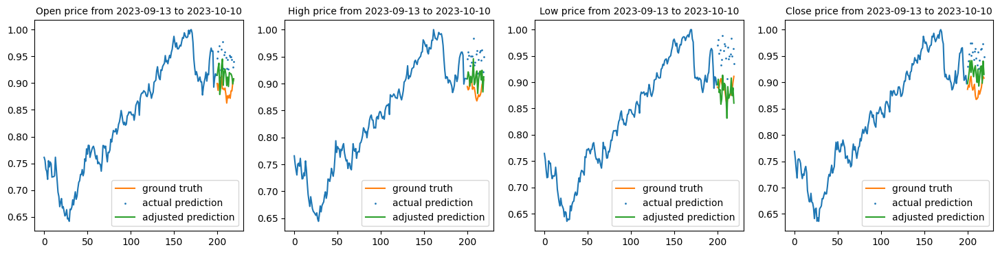

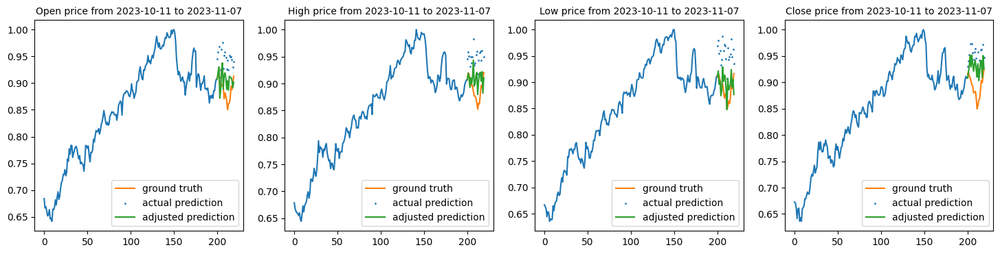

5722/5722 [==============================] - 126s 22ms/step - loss: 0.0011 - val_loss: 0.0036
Epoch 5/15
1/1 [==============================] - 0s 26ms/step


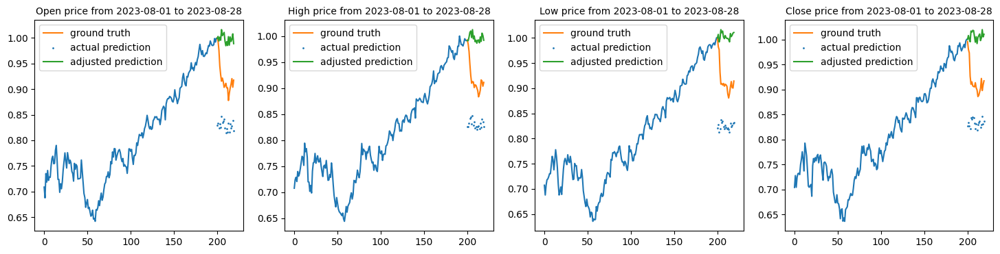

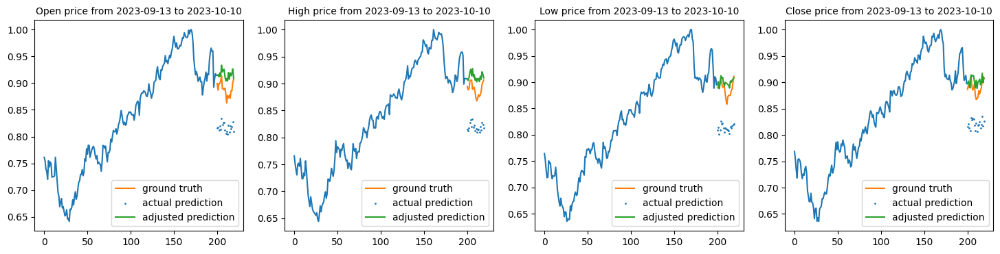

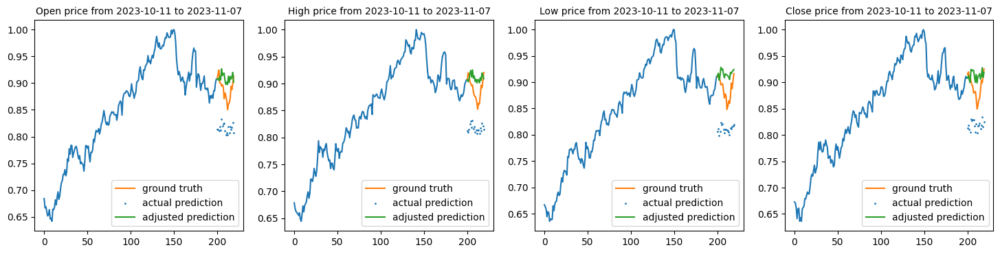

5722/5722 [==============================] - 117s 21ms/step - loss: 0.0011 - val_loss: 0.0067
Epoch 6/15
1/1 [==============================] - 0s 38ms/step


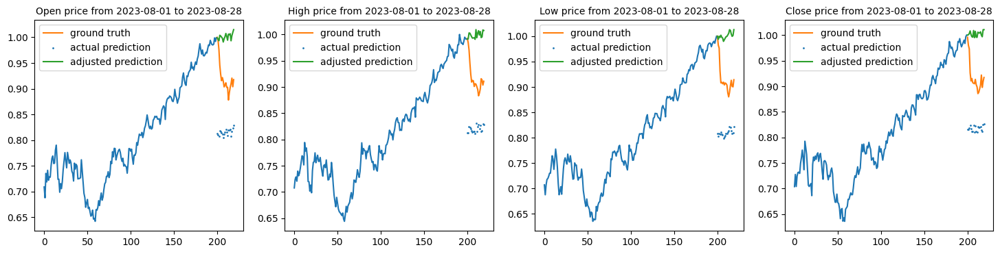

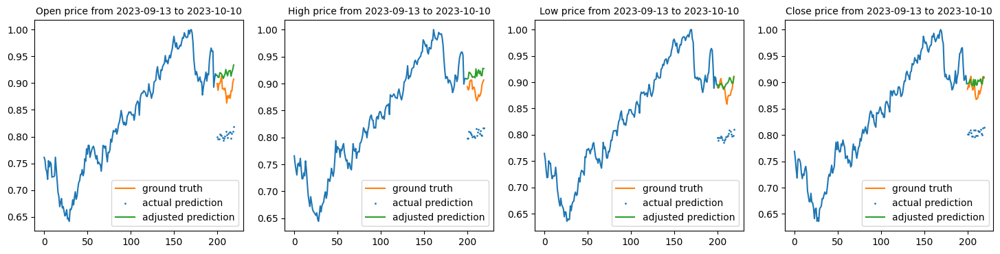

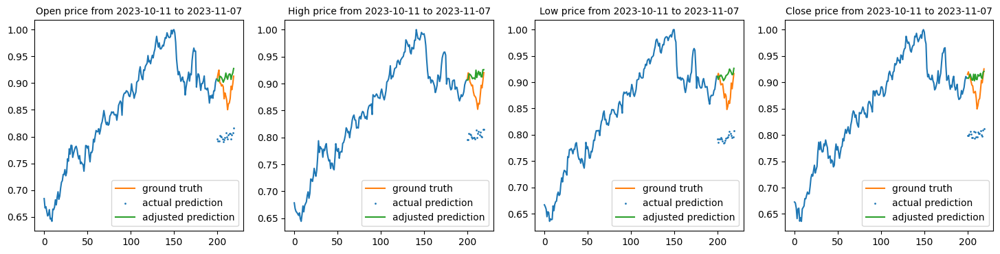

5722/5722 [==============================] - 118s 21ms/step - loss: 9.8216e-04 - val_loss: 0.0092
Epoch 7/15
1/1 [==============================] - 0s 49ms/step


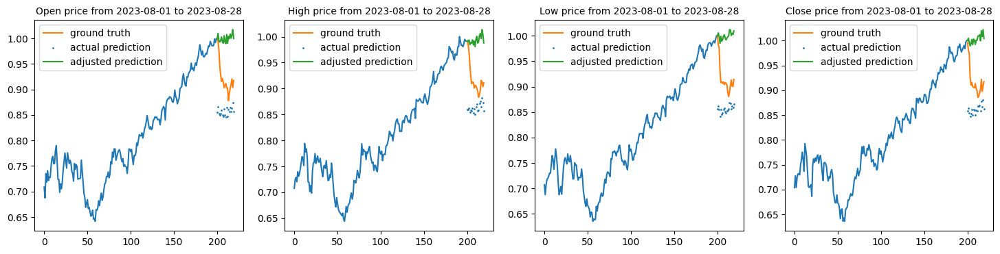

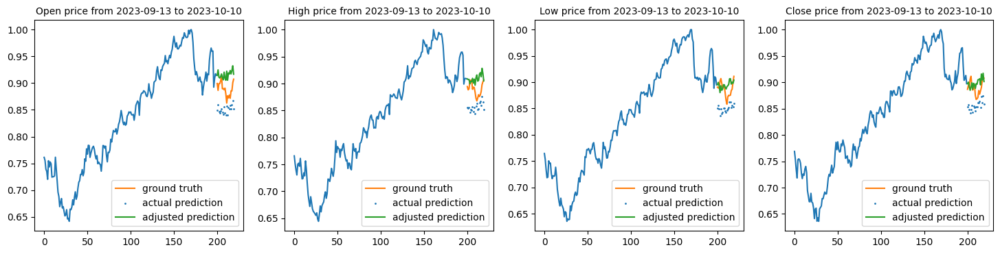

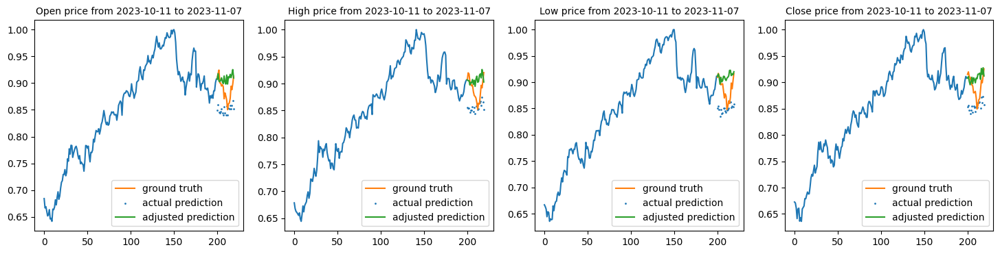

5722/5722 [==============================] - 120s 21ms/step - loss: 9.4523e-04 - val_loss: 0.0026
Epoch 8/15
1/1 [==============================] - 0s 21ms/step


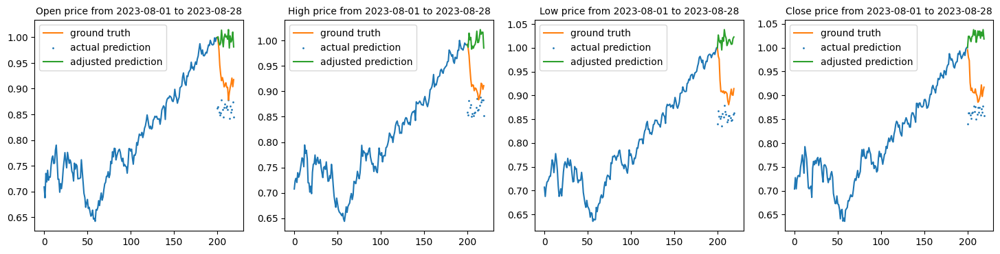

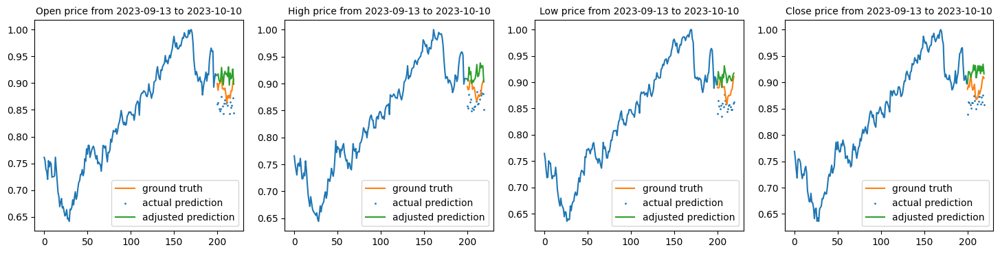

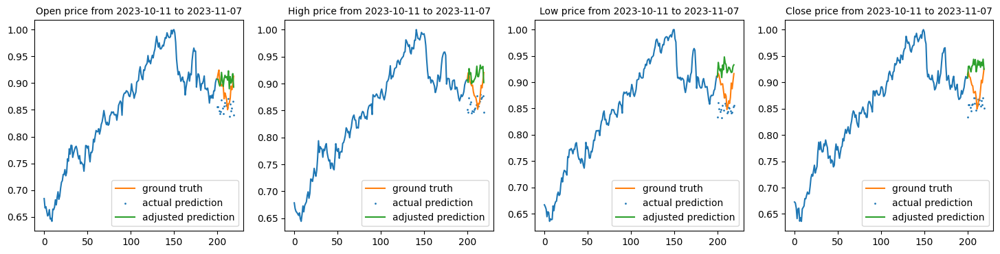

5722/5722 [==============================] - 121s 21ms/step - loss: 0.0010 - val_loss: 0.0024
Epoch 9/15
1/1 [==============================] - 0s 39ms/step


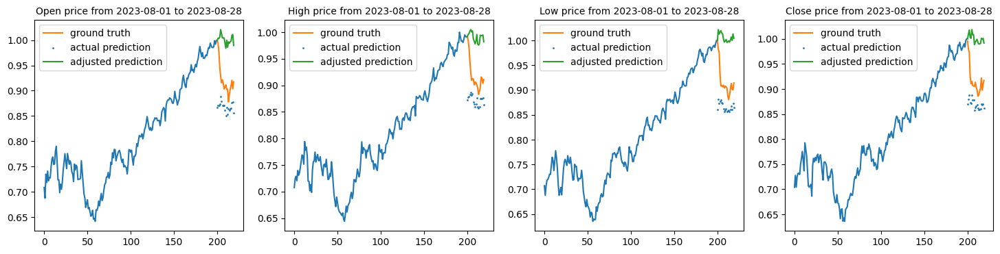

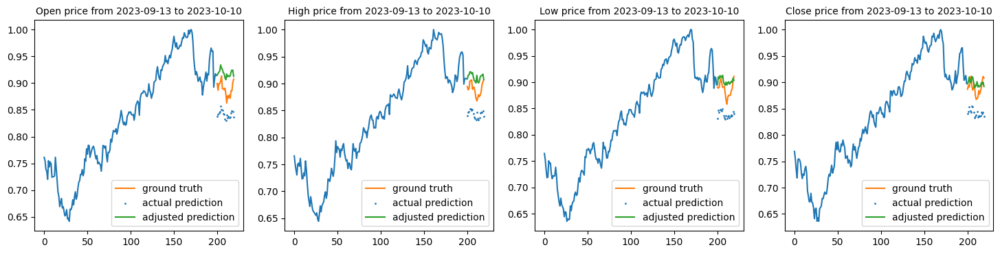

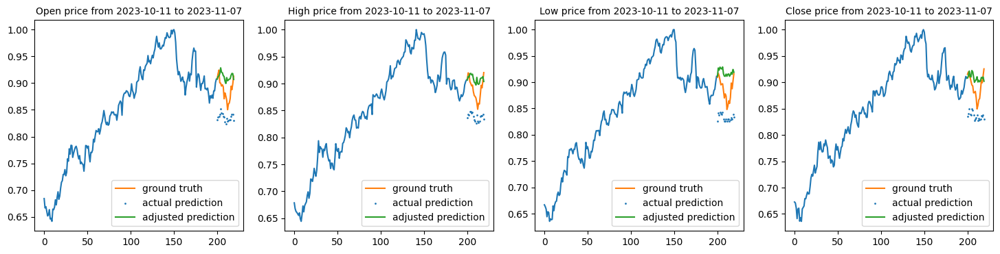

5722/5722 [==============================] - 130s 23ms/step - loss: 0.0010 - val_loss: 0.0029
Epoch 10/15
1/1 [==============================] - 0s 45ms/step


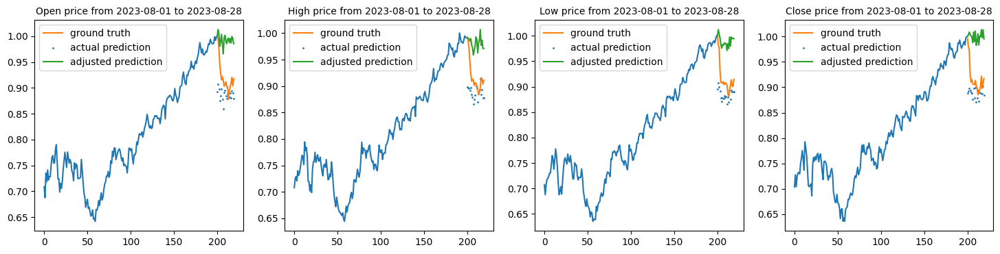

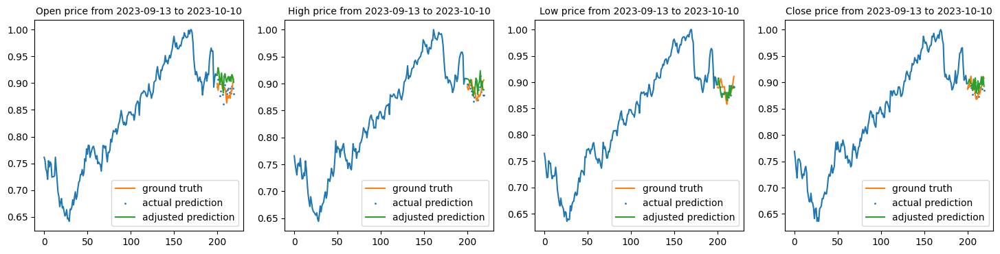

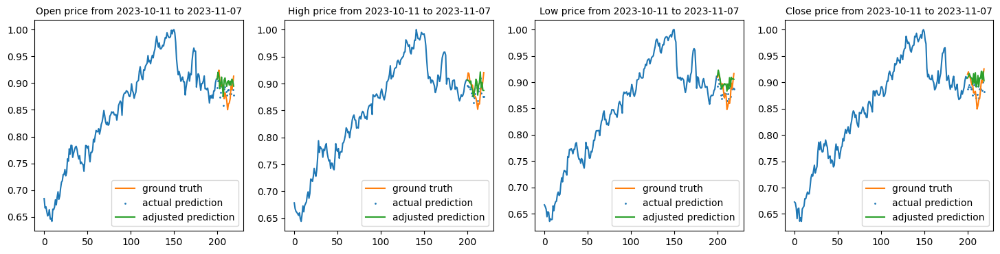

5722/5722 [==============================] - 133s 23ms/step - loss: 0.0010 - val_loss: 8.1094e-04
Epoch 11/15
1/1 [==============================] - 0s 35ms/step


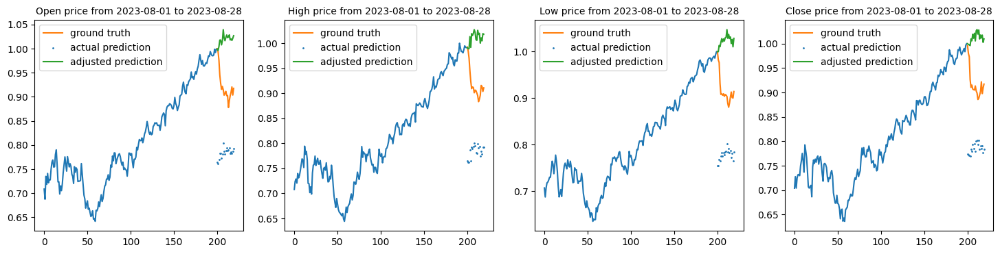

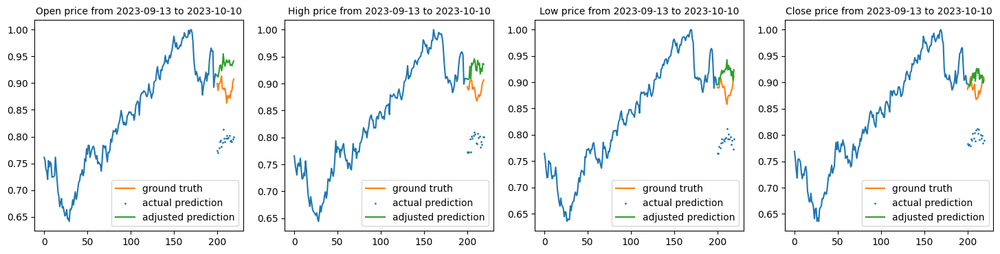

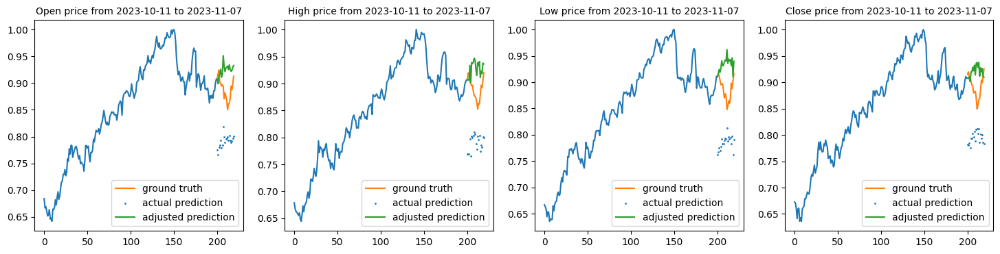

5722/5722 [==============================] - 131s 23ms/step - loss: 9.1772e-04 - val_loss: 0.0135
Epoch 12/15
1/1 [==============================] - 0s 46ms/step


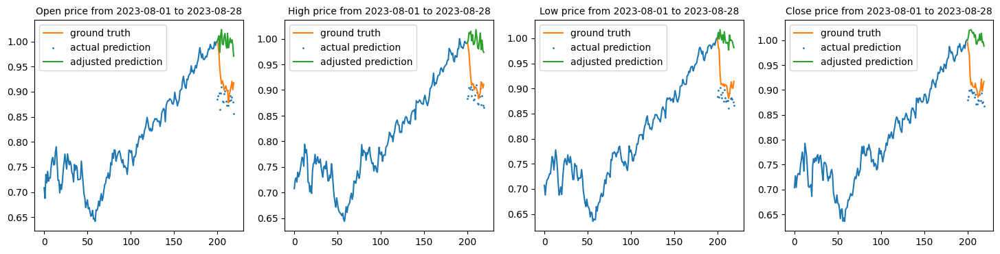

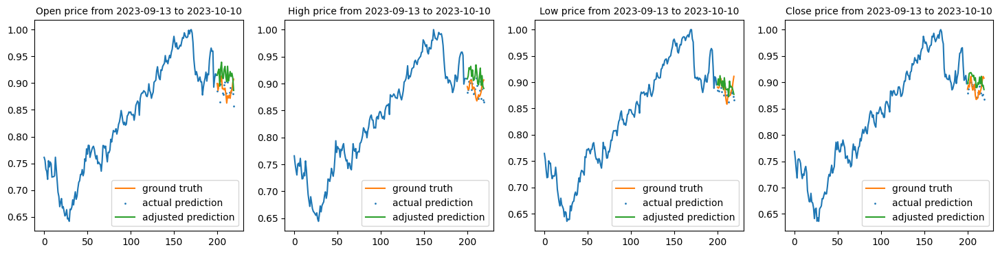

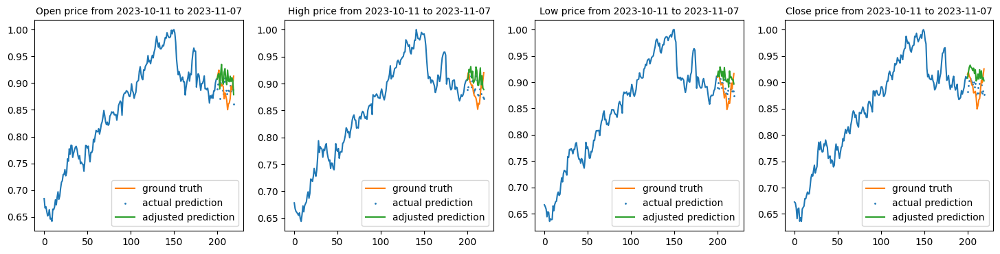

5722/5722 [==============================] - 128s 22ms/step - loss: 9.4420e-04 - val_loss: 9.5522e-04
Epoch 13/15
1/1 [==============================] - 0s 33ms/step


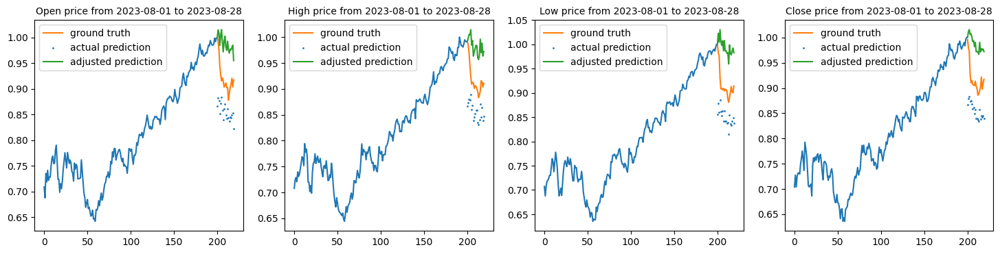

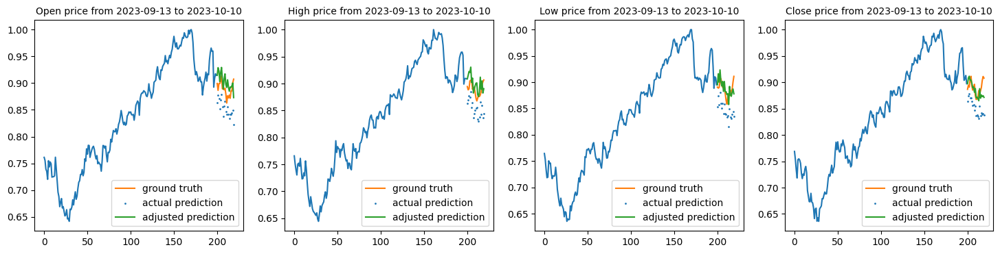

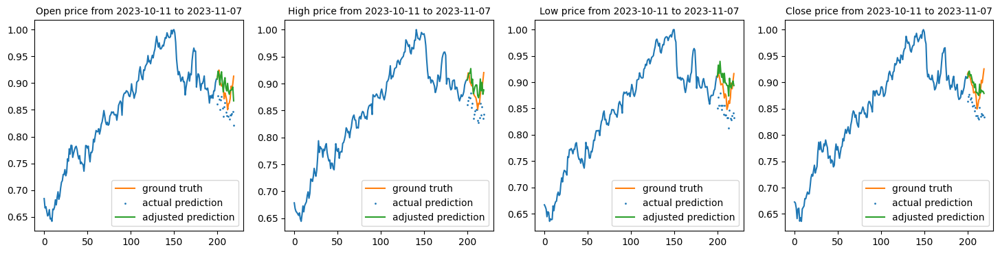

5722/5722 [==============================] - 126s 22ms/step - loss: 9.3489e-04 - val_loss: 0.0028
Epoch 14/15
1/1 [==============================] - 0s 37ms/step


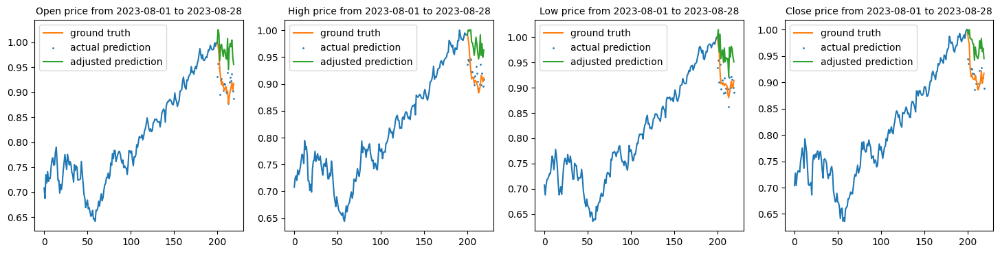

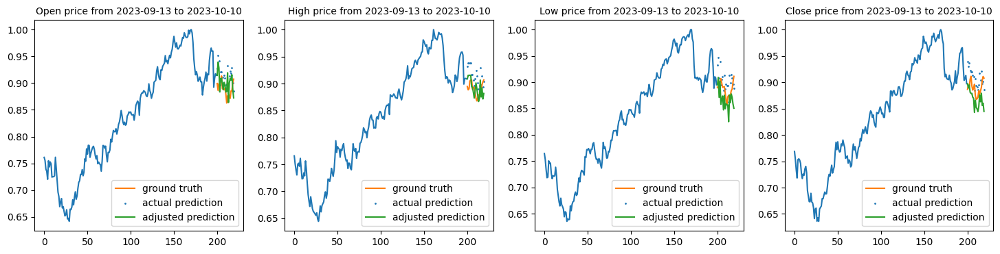

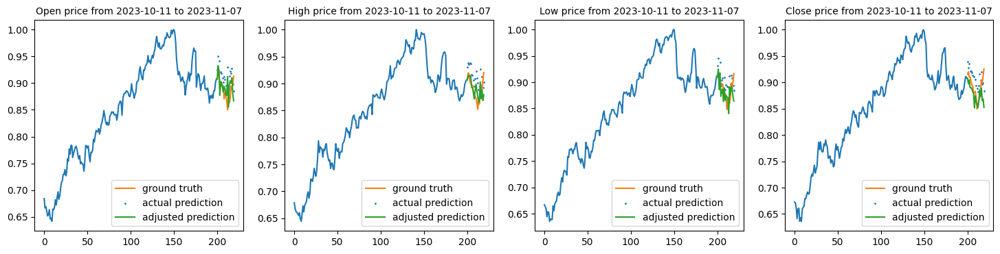

5722/5722 [==============================] - 123s 22ms/step - loss: 8.3421e-04 - val_loss: 7.4353e-04
Epoch 15/15
1/1 [==============================] - 0s 32ms/step


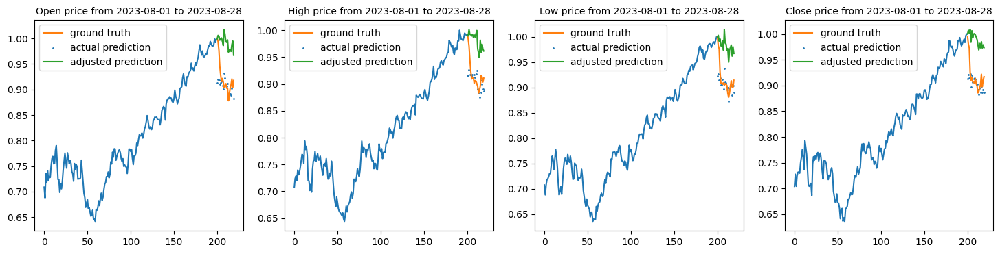

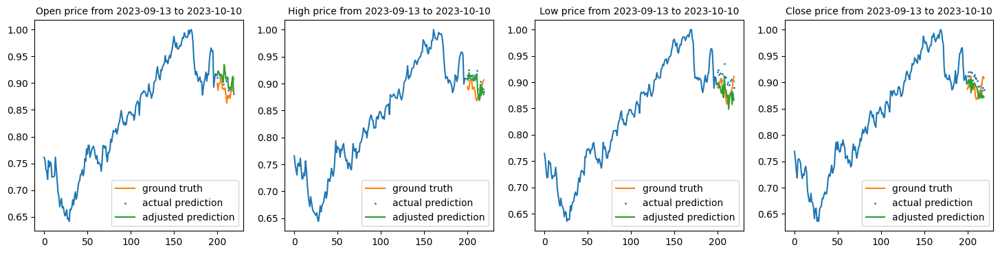

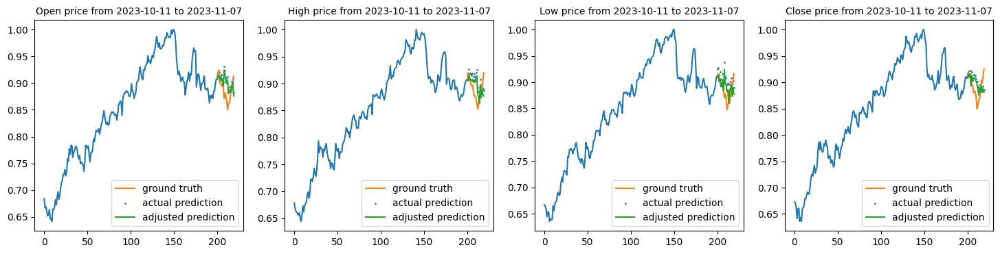

5722/5722 [==============================] - 125s 22ms/step - loss: 7.2584e-04 - val_loss: 7.2652e-04
[0.0023686103522777557, 0.003409438533708453, 0.008352130651473999, 0.0035644855815917253, 0.006705620791763067, 0.00923591572791338, 0.0026337311137467623, 0.0024181429762393236, 0.002947309985756874, 0.0008109397604130208, 0.013492313213646412, 0.0009552156552672386, 0.0027978757862001657, 0.0007435308652929962, 0.0007265180465765297]
[0.0020981086418032646, 0.0014080166583880782, 0.001240153331309557, 0.001110916375182569, 0.001100527006201446, 0.0009821555577218533, 0.0009452284430153668, 0.0010106321424245834, 0.0010104280663654208, 0.001025722362101078, 0.000917722936719656, 0.0009442002628929913, 0.0009348919265903533, 0.0008342095534317195, 0.0007258428959175944]


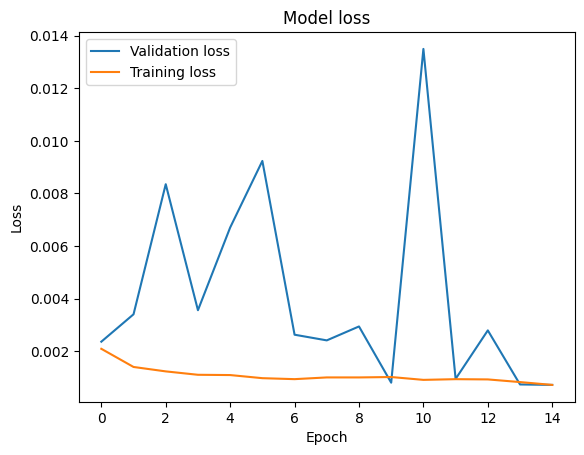

In [ ]:
AAPL_lstm_model_callback  = CustomCallback(AAPL_lstm_model, AAPL_x_test[:,:,:], SPX_x_test[:,:,:], AAPL_y_test[:,:,:5])
AAPL_lstm_model_history = AAPL_lstm_model.fit(AAPL_x_train[:,:,1:].astype('float32'), AAPL_y_train[:,:,1:5].astype('float32'), epochs=15, batch_size=1, callbacks=[AAPL_lstm_model_callback], validation_data=(AAPL_x_test[:,:,1:].astype('float32'), AAPL_y_test[:,:,1:5].astype('float32')))


print(AAPL_lstm_model_history.history['val_loss'])
print(AAPL_lstm_model_history.history['loss'])

plt.plot(AAPL_lstm_model_history.history['val_loss'])
plt.plot(AAPL_lstm_model_history.history['loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Validation loss', 'Training loss'])
plt.show()